# Homogenous Regions with fixed Labour

| Scenario | Adaptation | Purpose |
|----------|------------|---------|
| 1 | — | No shocks, no adaptation (baseline) |
| 2 | 0 = off | Shocks only, no adaptation |
| 3 | 2 = Recovery | Shocks + recovery adaptation |
| 4 | 1 = Protection | Shocks + protection adaptation |
| 5 | 3 = Both | Shocks + full adaptation |

In [165]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
import geopandas as gpd
import sys
from scipy.stats import beta
import requests
from matplotlib.colors import ListedColormap
import importlib
from scipy.stats import beta as beta_dist
import seaborn as sns

import json
import plotly.express as px
import plotly.graph_objects as go
from matplotlib.colors import to_hex
from matplotlib.patches import FancyBboxPatch


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [166]:

# Load reusable reader from scripts/read_batch_runs.py
project_root = Path.cwd()
if not (project_root / "scripts").exists():
    project_root = project_root.parent
if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

In [167]:
import scripts.read_batch_runs as _rbr
importlib.reload(_rbr)

from scripts.read_batch_runs import (
    load_simulation_results_matrix,
    check_regional_consistency,
)
from scripts.visualise_shocks import *
from scripts.compute_macros import *
from scripts.lineplots import *

## Set up paths

In [168]:
# Set path for output figures
OUTPUT = Path("/Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/homogenous_regions_ls/")
OUTPUT.mkdir(parents=True, exist_ok=True)

# define paths to experiment runs.
PATHS = {
    'scenario' : Path("/Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/homogenous_regions_ls"),
    }

## Read Simulation results

In [169]:
# load simulation result matrices
sim_matrix = {}
for PATH in PATHS.keys():
    sim_matrix[PATH] = load_simulation_results_matrix(PATHS[PATH])

Found 5 scenario candidate folders under /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/homogenous_regions_ls
Scenario 1: run_folders=30, max_run=30, macro_files_loaded=30, region_files_loaded=90, max_region=3, shock_files_loaded=0
  Scenario 1: saved to scenario_1.csv.gz
Scenario 2: run_folders=30, max_run=30, macro_files_loaded=30, region_files_loaded=90, max_region=3, shock_files_loaded=30
  Scenario 2: saved to scenario_2.csv.gz
Scenario 3: run_folders=30, max_run=30, macro_files_loaded=30, region_files_loaded=90, max_region=3, shock_files_loaded=30
  Scenario 3: saved to scenario_3.csv.gz
Scenario 4: run_folders=30, max_run=30, macro_files_loaded=30, region_files_loaded=90, max_region=3, shock_files_loaded=30
  Scenario 4: saved to scenario_4.csv.gz
Scenario 5: run_folders=30, max_run=30, macro_files_loaded=30, region_files_loaded=90, max_region=3, shock_files_loaded=30
  Scenario 5: saved to scenario_5.csv.gz
Consolidated shape=(420000, 143)


In [170]:
# Extract simulation results
scenario_results = {}
for sim in sim_matrix.keys():
    for scenario_num in sim_matrix[sim].scenario.unique():
        scenario_results[f"{sim}_{scenario_num}"] = sim_matrix[sim].loc[sim_matrix[sim].scenario == scenario_num]
        

## Set colormap & region index

In [171]:
region_meta = {
    "macro": {"name": "Macro",   "color": "#4A4A4A"},
    1:       {"name": "North",   "color": "#5665CC"},
    2:       {"name": "Central", "color": "#EC4B37"},
    3:       {"name": "South",   "color": "#03C58E"},
}
SCENARIO_META = {
    "scenario_1": {"name": "No Shock",             "color": "#B0B0B0", "linestyle": ":",  "linewidth": 1.5},
    "scenario_2": {"name": "Climate Shock",         "color": "#4A4A4A", "linestyle": "--", "linewidth": 1.5},
    "scenario_3": {"name": "Recovery",              "color": "#7B2D8B", "linestyle": "-",  "linewidth": 2},
    "scenario_4": {"name": "Protection",            "color": "#FF6F00", "linestyle": "-",  "linewidth": 2},
    "scenario_5": {"name": "Recovery + Protection", "color": "#005F73", "linestyle": "-",  "linewidth": 2},
}
green = "#4dff88"  
red = "#ff4d73"

## Compute Macros

In [172]:
def compare_scenarios(df_a, df_b, metric_a, metric_b=None, t_min=300, label_a="DSK", label_b="R-DSK", alpha=0.05, region="macro"):
    """Compare a metric between two scenario DataFrames using Welch's t-test.

    Observations are first averaged per Monte Carlo run (over t > t_min),
    so each run contributes exactly one independent data point to the test.

    Parameters
    ----------
    df_a, df_b : pandas.DataFrame
        Scenario DataFrames containing columns ``t``, ``run``, and ``metric``.
    metric_a : str
        Column name from df_a to compare (e.g. 'Unemployment', 'GDP_r_growth').
    metric_b : str
        Column name from  df_b to compare (e.g. 'Unemployment', 'GDP_r_growth').
    t_min : int, default 300
        Only include observations with t > t_min before averaging.
    label_a, label_b : str
        Display labels for each scenario in printed output.
    alpha : float, default 0.05
        Significance level for the test.
    """
    if metric_b is None:
        metric_b = metric_a
        
    # Filter to macro region if multiple regions present
    if "region" in df_a.columns and df_a["region"].nunique() > 1:
        df_a = df_a[df_a["region"] == region]
    if "region" in df_b.columns and df_b["region"].nunique() > 1:
        df_b = df_b[df_b["region"] == region]

    # Aggregate to run-level means (one independent observation per run)
    a = (
        df_a.loc[df_a["t"] > t_min, ["run", metric_a]]
        .groupby("run")[metric_a].mean()
        .dropna()
    )
    b = (
        df_b.loc[df_b["t"] > t_min, ["run", metric_b]]
        .groupby("run")[metric_b].mean()
        .dropna()
    )

    print(f"Metric : {metric_a} ({label_a}) and {metric_b} ({label_b})  (t > {t_min},  aggregated to run-level means)")
    print(f"  {label_a:10s}  mean={a.mean():.4f}  std={a.std():.4f}  n_runs={len(a)}")
    print(f"  {label_b:10s}  mean={b.mean():.4f}  std={b.std():.4f}  n_runs={len(b)}")

    # Welch's t-test on run-level means
    t_stat, p_value = stats.ttest_ind(a, b, equal_var=True)
    print(f"\n  Welch's t-test  (H0: equal means across runs)")
    print(f"    t-statistic : {t_stat:.4f}")
    print(f"    p-value     : {p_value:.4e}")
    print(f"    Significant : {'Yes' if p_value < alpha else 'No'} (α = {alpha})")

    # ── Print table ─────────────────────────────────────────────────────────
    def _sig_star(p):
        if p < 0.001: return "***"
        if p < 0.01:  return "**"
        if p < 0.05:  return "*"
        return ""

    ratio = b.mean() / a.mean()
    col_width = 22
    metric_display = metric_a if metric_a == metric_b else f"{metric_a}/{metric_b}"
    col_label = f"{label_b} / {label_a}"
    header_parts = [f"{'Metric':>25s}", f"{col_label:^{col_width}s}"]
    sep = "  ".join(["-" * 25, "-" * col_width])
    star = _sig_star(p_value)
    cell = f"{ratio:.4f} (t={t_stat:+.2f}){star}"

    print()
    print("  ".join(header_parts))
    print(sep)
    print("  ".join([f"{metric_display:>25s}", f"{cell:^{col_width}s}"]))
    print(sep)
    print(f"\nRatio = {label_b} / {label_a}  (run-level means, t > {t_min})")
    print(f"Significance: * p<0.05, ** p<0.01, *** p<0.001")
    print()


def compare_crisis_likelihood(df_a, df_b, t_min=300, threshold=-5.0,
                               label_a="DSK", label_b="HRHS", alpha=0.05):
    """Compare per-run crisis likelihood between two scenario DataFrames.

    For each run, crisis likelihood = proportion of quarters (t > t_min)
    where GDP_r_growth < threshold. The resulting per-run likelihoods are
    then compared with Welch's t-test, giving one independent observation
    per Monte Carlo run.

    Parameters
    ----------
    df_a, df_b : pandas.DataFrame
        Scenario DataFrames containing columns ``t``, ``run``,
        and ``GDP_r_growth``.
    t_min : int, default 300
        Only include observations with t > t_min.
    threshold : float, default -5.0
        Crisis threshold in percent (Lamperti et al. 2018: -5.0).
    label_a, label_b : str
        Display labels for each scenario in printed output.
    alpha : float, default 0.05
        Significance level for the test.
    """
    def _run_level_likelihood(df):
        # Filter to macro region if multiple regions present
        if "region" in df.columns and df["region"].nunique() > 1:
            df = df[df["region"] == "macro"]

        work = df.loc[df["t"] > t_min, ["run", "GDP_r_growth"]].copy()
        valid = work["GDP_r_growth"].notna()

        # Binary crisis flag per row
        work["_crisis"] = np.where(valid, (work["GDP_r_growth"] < threshold).astype(int), np.nan)

        # Per-run likelihood = crisis quarters / valid quarters
        obs   = work[valid].groupby("run")["_crisis"].count()
        crises = work[valid].groupby("run")["_crisis"].sum()
        return (crises / obs.replace(0, np.nan)).astype(float).dropna()

    a = _run_level_likelihood(df_a)
    b = _run_level_likelihood(df_b)

    print(f"Crisis likelihood  (GDP_r_growth < {threshold}%,  t > {t_min})")
    print(f"  {label_a:10s}  mean={a.mean():.4f}  std={a.std():.4f}  n_runs={len(a)}")
    print(f"  {label_b:10s}  mean={b.mean():.4f}  std={b.std():.4f}  n_runs={len(b)}")

    t_stat, p_value = stats.ttest_ind(a, b, equal_var=True)
    print(f"\n  Welch's t-test  (H0: equal crisis likelihood across runs)")
    print(f"    t-statistic : {t_stat:.4f}")
    print(f"    p-value     : {p_value:.4e}")
    print(f"    Significant : {'Yes' if p_value < alpha else 'No'} (α = {alpha})")
    print()


In [173]:
for scenario in scenario_results.keys():
    #  Compute unemployment
    scenario_results[scenario]['Unemployment'] = (1 - scenario_results[scenario].EmploymentRate) * 100
    # Compute GDP volatility
    scenario_results[scenario]['GDP_r_volatility'] = compute_GDP_r_volatility(scenario_results[scenario])
    # Compute log GDP
    scenario_results[scenario]['GDP_r_log'] = np.log(scenario_results[scenario]['GDP_r'])
    #  Compute Output Growth Rate
    scenario_results[scenario]['GDP_r_growth'] = compute_gdp_r_growth(scenario_results[scenario])
    # Compute GDP Growth Rate per capita
    scenario_results[scenario]['GDP_r_growth_per_capita'] = scenario_results[scenario]['GDP_r_growth'] / scenario_results[scenario]['LS']
    # compute deficit based on Deficit = Deficit / GDP_n
    scenario_results[scenario]['Deficit'] = scenario_results[scenario]['Deficit'] / scenario_results[scenario]['GDP_n'] 
    # Compute I_protection over GDP
    scenario_results[scenario]['I_protection_over_GDP'] = scenario_results[scenario]['I_protection'] / scenario_results[scenario]['GDP_r'] 
    # compute recovery over GDP
    scenario_results[scenario]['Recovery_over_GDP'] = scenario_results[scenario]['Recovery'] / scenario_results[scenario]['GDP_r'] 
    # compute recovery over RegGov_TopupGrant
    scenario_results[scenario]['Recovery_over_RegGov_TopupGrant'] = scenario_results[scenario]['Recovery'] / scenario_results[scenario]['RegGov_TopupGrant']
    # Rolling crisis likelihood: fraction of last 4 quarters where GDP growth < -5%
    scenario_results[scenario]['crisis_likelihood'] = (
        scenario_results[scenario]
        .groupby('run')['GDP_r_growth']
        .transform(lambda x: (x < -5).rolling(1, min_periods=1).mean())
    )


/var/folders/1v/430f_9l153b4xn65sf8n__xm0000gn/T/ipykernel_25768/137381507.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scenario_results[scenario]['Unemployment'] = (1 - scenario_results[scenario].EmploymentRate) * 100
/var/folders/1v/430f_9l153b4xn65sf8n__xm0000gn/T/ipykernel_25768/137381507.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scenario_results[scenario]['GDP_r_volatility'] = compute_GDP_r_volatility(scenario_results[scenario])
/var/folders/1v/430f_9l153b4xn65sf8n__xm0000gn/T/ipykernel_25768/137381507.py:7

## Methods

In [174]:
def plot_regional_metric(
    metric,
    scenario_results,
    region_meta,
    scenario_num="scenario_1",
    metric_label=None,
    window=None,
    share_y_macro=False,
    regional_gap=0.01,
    output=None,
    tmin=0,
    tmax=700,
    ci_std=1,
    ylim_macro=None,
    ylim_regional=None,
):
    if metric_label is None:
        metric_label = metric

    RATE_METRICS = {"GDP_r_growth"}
    LEVEL_MAP = {"GDP_r_growth": "GDP_r"}

    df = scenario_results[scenario_num]

    if metric in RATE_METRICS and metric in LEVEL_MAP:
        level_col = LEVEL_MAP[metric]

        if level_col not in df.columns:
            raise ValueError(
                f"Level column '{level_col}' needed to recompute "
                f"'{metric}' is missing."
            )

        # Step 1: compute growth per run so run-level variance is preserved
        df_levels = df.copy().sort_values(["region", "run", "t"])
        df_levels[metric] = df_levels.groupby(["region", "run"])[level_col].transform(
            lambda x: ((x / x.shift(1)) ** 4 - 1) * 100
        )

        # Step 2: aggregate across runs
        df_metric = (
            df_levels.groupby(["t", "region"])[metric]
            .agg(mean_val="mean", std_val="std")
            .reset_index()
        )

    else:
        # For non-rate metrics: aggregate directly across runs
        df_metric = (
            df.groupby(["t", "region"])[metric]
            .agg(mean_val="mean", std_val="std")
            .reset_index()
        )

    # Step 3: rolling mean on full series BEFORE time filter
    if window is not None:
        df_metric["mean_val"] = df_metric.groupby("region")["mean_val"].transform(
            lambda x: x.rolling(window=window, min_periods=1).mean()
        )
        df_metric["std_val"] = df_metric.groupby("region")["std_val"].transform(
            lambda x: x.rolling(window=window, min_periods=1).mean()
        )

    # Step 4: apply time filter after rolling mean
    df_metric = df_metric[(df_metric["t"] >= tmin) & (df_metric["t"] <= tmax)]

    fig, axs = plt.subplots(1, 4, figsize=(15, 3), sharex=True)

    # sharey must be set BEFORE set_ylim so shared limits are not overridden
    axs[2].sharey(axs[1])
    axs[3].sharey(axs[1])
    if share_y_macro:
        axs[0].sharey(axs[1])

    # axs[0] = macro panel; axs[1-3] = regional panels
    if ylim_macro is not None:
        axs[0].set_ylim(ylim_macro)
    if ylim_regional is not None:
        axs[1].set_ylim(ylim_regional)  # axs[2] and axs[3] follow via sharey

    for i, region in enumerate(region_meta.keys()):
        sub = df_metric[df_metric["region"] == region]
        color = region_meta[region]["color"]

        axs[i].plot(sub["t"], sub["mean_val"], color=color)
        axs[i].fill_between(
            sub["t"],
            sub["mean_val"] - ci_std * sub["std_val"],
            sub["mean_val"] + ci_std * sub["std_val"],
            color=color, alpha=0.2,
        )
        axs[i].set_title(region_meta[region]["name"])
        axs[i].set_xlabel("Timestep")
        axs[i].grid(True, color="lightgray", linestyle="--", linewidth=0.5)
        axs[i].spines[["top", "right", "left", "bottom"]].set_visible(False)

        if tmin == 300:
            axs[i].axvline(x=300, color="gray", linestyle="--", linewidth=1)

        if i == 0:
            axs[i].set_ylabel(metric_label)
            axs[i].set_facecolor("#FFFBF3")
            axs[i].spines[["top", "right", "left", "bottom"]].set_visible(True)
        elif i == 1:
            axs[i].set_ylabel(metric_label)
        else:
            axs[i].tick_params(labelleft=False)

    plt.tight_layout()
    fig.canvas.draw()

    for j in [2, 3]:
        prev = axs[j - 1].get_position()
        cur = axs[j].get_position()
        axs[j].set_position([prev.x1 + regional_gap, cur.y0, cur.width, cur.height])

    fig.canvas.draw()

    b1, b3 = axs[1].get_position(), axs[3].get_position()
    fig.add_artist(FancyBboxPatch(
        (b1.x0 + 0.001, b1.y0),
        b3.x1 - b1.x0,
        b1.y1 - b1.y0,
        boxstyle="round,pad=0.005",
        linewidth=1.2,
        edgecolor="gray",
        facecolor="none",
        transform=fig.transFigure,
        clip_on=False,
    ))

    if output is not None:
        plt.savefig(
            output / f"{scenario_num}_{metric}_panel.png",
            dpi=300, bbox_inches="tight"
        )

    plt.show()


In [175]:
def compare_regional_metric(
    metric,
    scenario_results,
    region_meta,
    scenario_num,
    baseline_scenario_num,
    no_shock_scenario_num=None,
    metric_label=None,
    window=20,
    share_y_macro=False,
    regional_gap=0.01,
    output=None,
    tmin=0,
    tmax=700,
    color_above="#e08214",
    color_below="#8073ac",
    scenario_meta=None,
    ylim_macro=None,
    ylim_regional=None,
):
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch

    if metric_label is None:
        metric_label = metric

    # Accept explicit metadata, but keep backward-compatible fallbacks.
    if scenario_meta is None:
        scenario_meta = globals().get("SCENARIO_META") or globals().get("SCENARIO_META")
    if scenario_meta is None:
        raise ValueError("scenario_meta is required. Define SCENARIO_META/SCENARIO_META or pass scenario_meta=...")

    # Metrics that must be recomputed from levels after averaging runs
    RATE_METRICS = {"GDP_r_growth", "GDP_r_volatility"}

    # Map rate metric -> the underlying level column needed to recompute it
    LEVEL_MAP = {
        "GDP_r_growth": "GDP_r",
    }

    def _prepare(snum):
        df = scenario_results[snum]

        if metric in RATE_METRICS and metric in LEVEL_MAP:
            level_col = LEVEL_MAP[metric]

            # Step 1: average LEVELS across runs
            df_m = (
                df.groupby(["t", "region"])[level_col]
                .mean()
                .reset_index()
            )

            # Step 2: compute growth from averaged levels
            df_m = df_m.sort_values(["region", "t"])
            df_m[metric] = df_m.groupby("region")[level_col].transform(
                lambda x: ((x / x.shift(1)) ** 4 - 1) * 100
            )

        else:
            # For non-rate metrics average directly as before
            df_m = (
                df.groupby(["t", "region"])[metric]
                .mean()
                .reset_index()
            )

        # Step 3: rolling mean after computing the metric
        if window is not None:
            df_m[metric] = df_m.groupby("region")[metric].transform(
                lambda x: x.rolling(window=window, min_periods=1).mean()
            )

        return df_m[(df_m["t"] >= tmin) & (df_m["t"] <= tmax)]

    df_base = _prepare(baseline_scenario_num)
    df_scen = _prepare(scenario_num)
    if no_shock_scenario_num is not None:
        df_no_shock = _prepare(no_shock_scenario_num)

    fig, axs = plt.subplots(1, 4, figsize=(15, 3), sharex=True)
    axs[2].sharey(axs[1])
    axs[3].sharey(axs[1])
    if share_y_macro:
        axs[0].sharey(axs[1])

    # Set different y-limits for macro vs regional if specified
    if ylim_macro is not None:
        axs[0].set_ylim(ylim_macro)
    if ylim_regional is not None:
        for i in [1, 2, 3]:
            axs[i].set_ylim(ylim_regional)
            
    for i, region in enumerate(region_meta.keys()):
        color = region_meta[region]["color"]

        sub_base = df_base[df_base["region"] == region]
        sub_scen = df_scen[df_scen["region"] == region]
        if no_shock_scenario_num is not None:
            sub_no_shock = df_no_shock[df_no_shock["region"] == region]

        merged = (
            sub_base[["t", metric]].rename(columns={metric: "_base"})
            .merge(sub_scen[["t", metric]].rename(columns={metric: "_scen"}), on="t")
        )
        if no_shock_scenario_num is not None:
            merged = merged.merge(
                sub_no_shock[["t", metric]].rename(columns={metric: "_no_shock"}),
                on="t"
            )

        t_vals = merged["t"].values
        base_vals = merged["_base"].values
        scen_vals = merged["_scen"].values
        if no_shock_scenario_num is not None:
            no_shock_vals = merged["_no_shock"].values

        axs[i].plot(
            t_vals, base_vals, color=color, linewidth=1.5,
            linestyle=scenario_meta[baseline_scenario_num]["linestyle"]
        )
        axs[i].plot(
            t_vals, scen_vals, color=color, linewidth=1.5,
            linestyle=scenario_meta[scenario_num]["linestyle"]
        )
        if no_shock_scenario_num is not None:
            axs[i].plot(
                t_vals, no_shock_vals, color=color, linewidth=1.5,
                linestyle=scenario_meta[no_shock_scenario_num]["linestyle"]
            )

        axs[i].fill_between(
            t_vals, base_vals, scen_vals,
            where=(scen_vals >= base_vals), interpolate=True,
            facecolor=color_above, edgecolor="gray",
            alpha=0.25, hatch="////", linewidth=0.5,
        )
        axs[i].fill_between(
            t_vals, base_vals, scen_vals,
            where=(scen_vals < base_vals), interpolate=True,
            facecolor=color_below, edgecolor="gray",
            alpha=0.25, hatch=r"\\\\", linewidth=0.5,
        )

        axs[i].axvline(x=300, color="black", linestyle="--", linewidth=0.8, alpha=0.5)
        axs[i].set_title(region_meta[region]["name"])
        axs[i].set_xlabel("Timestep")
        axs[i].grid(True, color="lightgray", linestyle="--", linewidth=0.5)
        axs[i].spines[["top", "right", "left", "bottom"]].set_visible(False)

        if i == 0:
            axs[i].set_ylabel(metric_label)
            axs[i].set_facecolor("#FFFBF3")
            axs[i].spines[["top", "right", "left", "bottom"]].set_visible(True)
        elif i == 1:
            axs[i].set_ylabel("")
        else:
            axs[i].tick_params(labelleft=False)

    legend_handles = [
        Line2D([0], [0], color="gray",
               linestyle=scenario_meta[snum]["linestyle"],
               linewidth=1.5,
               label=scenario_meta[snum]["name"])
        for snum in [baseline_scenario_num, scenario_num]
    ]
    if no_shock_scenario_num is not None:
        legend_handles.append(
            Line2D([0], [0], color="gray",
                   linestyle=scenario_meta[no_shock_scenario_num]["linestyle"],
                   linewidth=1.5,
                   label=scenario_meta[no_shock_scenario_num]["name"])
        )
    legend_handles += [
        Patch(facecolor=color_above, alpha=0.25, linewidth=0.1,
              label=f"{scenario_meta[scenario_num]['name']} > {scenario_meta[baseline_scenario_num]['name']}",
              hatch="////"),
        Patch(facecolor=color_below, alpha=0.25, linewidth=0.1,
              label=f"{scenario_meta[scenario_num]['name']} < {scenario_meta[baseline_scenario_num]['name']}",
              hatch=r"\\\\"),
    ]

    fig.legend(
        handles=legend_handles, loc="lower center",
        ncol=len(legend_handles), frameon=False,
        bbox_to_anchor=(0.5, -0.08)
    )

    plt.tight_layout()
    fig.canvas.draw()

    for j in [2, 3]:
        prev = axs[j - 1].get_position()
        cur = axs[j].get_position()
        axs[j].set_position([prev.x1 + regional_gap, cur.y0, cur.width, cur.height])

    fig.canvas.draw()

    b1, b3 = axs[1].get_position(), axs[3].get_position()
    fig.add_artist(FancyBboxPatch(
        (b1.x0 + 0.001, b1.y0),
        b3.x1 - b1.x0,
        b1.y1 - b1.y0,
        boxstyle="round,pad=0.005",
        linewidth=1.2,
        edgecolor="gray",
        facecolor="none",
        transform=fig.transFigure,
        clip_on=False,
    ))

    if output is not None:
        plt.savefig(
            output / f"{baseline_scenario_num}_vs_{scenario_num}_{metric}_panel_{tmin}-{tmax}.png",
            dpi=300, bbox_inches="tight",
        )

    plt.show()

In [176]:
def plot_regional_metric_distribution(
    metric,
    scenario_results,
    region_meta,
    scenario_meta,
    scenario_num,
    baseline_scenario_num,
    no_shock_scenario_num=None,
    metric_label=None,
    share_y_macro=False,
    output=None,
    ylim_macro=None,
    ylim_regional=None,
    summary="run_mean",  # "run_mean", "final", or "pooled_time_run"
    tmin=300,
    tmax=700,
):
    """
    Plot distribution of a metric across scenarios.

    summary:
        "run_mean"        -> one value per run: mean over time
        "final"           -> one value per run: final timestep only
        "pooled_time_run" -> one value per timestep/run; pools time and runs
    """
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    import matplotlib.collections as mcollections
    from matplotlib.lines import Line2D
    from matplotlib.patches import FancyBboxPatch

    if metric_label is None:
        metric_label = metric

    if "macro" not in region_meta:
        raise ValueError("region_meta must contain a 'macro' entry.")

    real_regions = [r for r in region_meta if r != "macro"]

    scenarios_to_plot = [baseline_scenario_num, scenario_num]
    if no_shock_scenario_num is not None:
        scenarios_to_plot = [no_shock_scenario_num, baseline_scenario_num, scenario_num]

    for snum in scenarios_to_plot:
        if snum not in scenario_results:
            raise KeyError(f"{snum!r} is missing from scenario_results.")
        if snum not in scenario_meta:
            raise KeyError(f"{snum!r} is missing from scenario_meta.")

    scenario_order = [scenario_meta[snum]["name"] for snum in scenarios_to_plot]
    scenario_linestyles = [scenario_meta[snum]["linestyle"] for snum in scenarios_to_plot]
    use_split = no_shock_scenario_num is None

    def _prepare(snum, regions):
        df = scenario_results[snum].copy()

        df = df[(df["t"] >= tmin) & (df["t"] <= tmax)]

        required_cols = {"t", "region", "run", metric}
        missing = required_cols - set(df.columns)
        if missing:
            raise ValueError(f"Scenario {snum!r} is missing columns: {missing}")

        df = df[df["region"].isin(regions)]

        if summary == "pooled_time_run":
            df_m = (
                df.groupby(["t", "region", "run"], as_index=False)[metric]
                .mean()
            )

        elif summary == "run_mean":
            df_m = (
                df.groupby(["region", "run"], as_index=False)[metric]
                .mean()
            )

        elif summary == "final":
            final_t = df["t"].max()
            df_final = df[df["t"] == final_t]
            df_m = (
                df_final.groupby(["region", "run"], as_index=False)[metric]
                .mean()
            )

        else:
            raise ValueError(
                "summary must be one of: 'run_mean', 'final', 'pooled_time_run'"
            )

        df_m["Scenario"] = scenario_meta[snum]["name"]
        df_m["ScenarioKey"] = snum
        return df_m

    df_reg = pd.concat(
        [_prepare(snum, real_regions) for snum in scenarios_to_plot],
        ignore_index=True,
    )
    region_order = [region_meta[r]["name"] for r in real_regions]
    df_reg["Region"] = df_reg["region"].map(lambda r: region_meta[r]["name"])

    df_mac = pd.concat(
        [_prepare(snum, ["macro"]) for snum in scenarios_to_plot],
        ignore_index=True,
    )
    df_mac["Region"] = region_meta["macro"]["name"]

    def _color_violins_by_region(ax, ordered_names, split=True):
        poly_cols = [
            c for c in ax.collections
            if isinstance(c, mcollections.PolyCollection)
        ]
        n_regions = len(ordered_names)

        if split:
            for i, name in enumerate(ordered_names):
                region_key = next(k for k, v in region_meta.items() if v["name"] == name)
                color = region_meta[region_key]["color"]

                for j in range(2):
                    idx = i * 2 + j
                    if idx < len(poly_cols):
                        poly_cols[idx].set_facecolor("none")
                        poly_cols[idx].set_edgecolor(color)
                        poly_cols[idx].set_linewidth(1.5)
                        poly_cols[idx].set_linestyle(scenario_linestyles[j])

        else:
            for k, pc in enumerate(poly_cols):
                scenario_idx = k // n_regions
                region_idx = k % n_regions

                if scenario_idx >= len(scenarios_to_plot) or region_idx >= n_regions:
                    continue

                name = ordered_names[region_idx]
                region_key = next(rk for rk, rv in region_meta.items() if rv["name"] == name)
                color = region_meta[region_key]["color"]

                pc.set_facecolor("none")
                pc.set_edgecolor(color)
                pc.set_linewidth(1.5)
                pc.set_linestyle(scenario_linestyles[scenario_idx])

        for line in ax.lines:
            xdata = line.get_xdata()
            if len(xdata) == 0:
                continue

            violin_idx = int(round(float(np.mean(xdata))))
            if 0 <= violin_idx < n_regions:
                name = ordered_names[violin_idx]
                region_key = next(k for k, v in region_meta.items() if v["name"] == name)
                line.set_color(region_meta[region_key]["color"])

    fig, (ax_mac, ax_reg) = plt.subplots(
        1, 2,
        figsize=(13, 4),
        gridspec_kw={"width_ratios": [1, 3]},
        sharey=share_y_macro,
    )
    if ylim_macro is not None:
        ax_mac.set_ylim(ylim_macro)
    if ylim_regional is not None:
        ax_reg.set_ylim(ylim_regional)
    if use_split:
        sns.violinplot(
            data=df_mac,
            x="Region",
            y=metric,
            hue="Scenario",
            hue_order=scenario_order,
            fill=False,
            split=True,
            inner="quartile",
            ax=ax_mac,
        )
        _color_violins_by_region(
            ax_mac,
            [region_meta["macro"]["name"]],
            split=True,
        )

        sns.violinplot(
            data=df_reg,
            x="Region",
            y=metric,
            hue="Scenario",
            hue_order=scenario_order,
            order=region_order,
            fill=False,
            split=True,
            inner="quartile",
            ax=ax_reg,
            legend=False,
        )
        _color_violins_by_region(ax_reg, region_order, split=True)

    else:
        for snum in scenarios_to_plot:
            df_s = df_mac[df_mac["ScenarioKey"] == snum]
            sns.violinplot(
                data=df_s,
                x="Region",
                y=metric,
                fill=False,
                inner="quartile",
                ax=ax_mac,
            )

        _color_violins_by_region(
            ax_mac,
            [region_meta["macro"]["name"]],
            split=False,
        )

        for snum in scenarios_to_plot:
            df_s = df_reg[df_reg["ScenarioKey"] == snum]
            sns.violinplot(
                data=df_s,
                x="Region",
                y=metric,
                order=region_order,
                fill=False,
                inner="quartile",
                ax=ax_reg,
                legend=False,
            )

        _color_violins_by_region(ax_reg, region_order, split=False)

    ax_mac.set_facecolor("#FFFBF3")
    ax_mac.spines[["top", "right", "left", "bottom"]].set_visible(True)
    ax_mac.set_ylabel(metric_label)
    ax_mac.set_xlabel("")
    ax_mac.grid(True, color="lightgray", linestyle="--", linewidth=0.5, axis="y")

    if ax_mac.get_legend() is not None:
        ax_mac.get_legend().remove()

    ax_reg.set_xlabel("")
    ax_reg.set_ylabel("")
    ax_reg.grid(True, color="lightgray", linestyle="--", linewidth=0.5, axis="y")
    ax_reg.spines[["top", "right", "left", "bottom"]].set_visible(False)


    if share_y_macro:
        ax_reg.tick_params(labelleft=False)

    if ax_reg.get_legend() is not None:
        ax_reg.get_legend().remove()

    legend_handles = [
        Line2D(
            [0],
            [0],
            color="gray",
            linestyle=scenario_meta[snum]["linestyle"],
            linewidth=1.5,
            label=scenario_meta[snum]["name"],
        )
        for snum in scenarios_to_plot
    ]

    ax_reg.legend(
        handles=legend_handles,
        frameon=False,
        loc="lower center",
        fontsize=12,
        ncol=len(legend_handles),
        bbox_to_anchor=(0.25, -0.25),
    )

    plt.tight_layout()
    fig.canvas.draw()

    b = ax_reg.get_position()
    fig.add_artist(
        FancyBboxPatch(
            (b.x0 + 0.001, b.y0),
            b.x1 - b.x0,
            b.y1 - b.y0,
            boxstyle="round,pad=0.005",
            linewidth=1.2,
            edgecolor="gray",
            facecolor="none",
            transform=fig.transFigure,
            clip_on=False,
        )
    )

    b_mac = ax_mac.get_position()
    gap = 0.03
    ax_mac.set_position([b.x0 - b_mac.width - gap, b.y0, b_mac.width, b_mac.height])
#
    if output is not None:
        plt.savefig(
            output / f"{baseline_scenario_num}_vs_{scenario_num}_{metric}_distribution.png",
            dpi=300,
            bbox_inches="tight",
        )

    plt.show()

## C-firm output

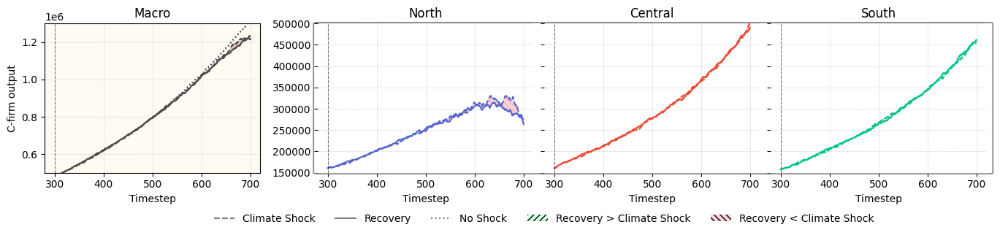

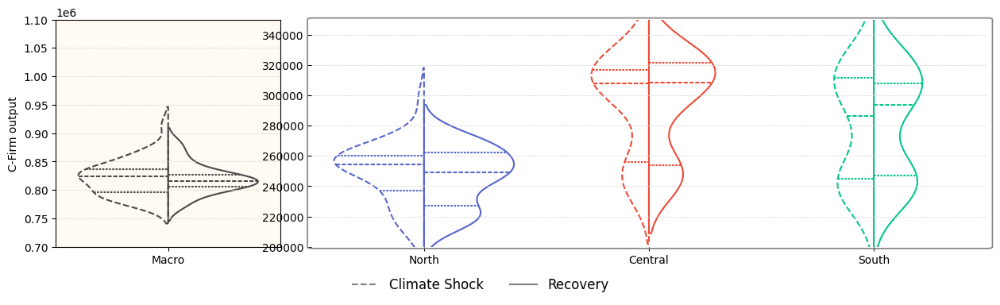

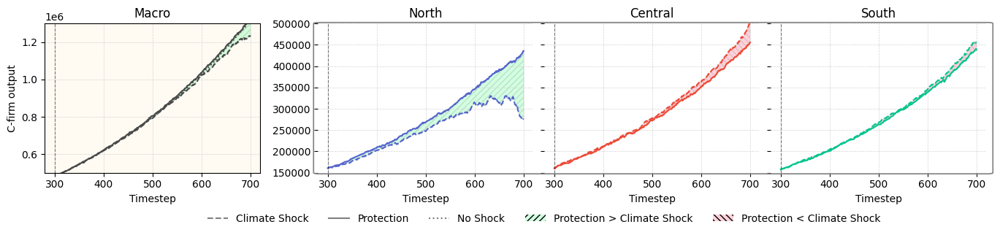

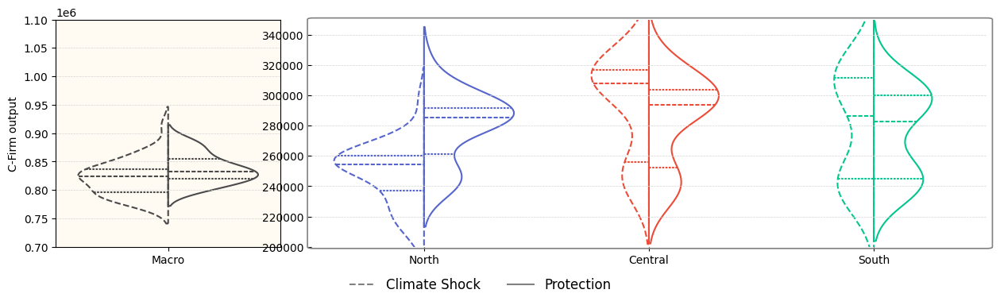

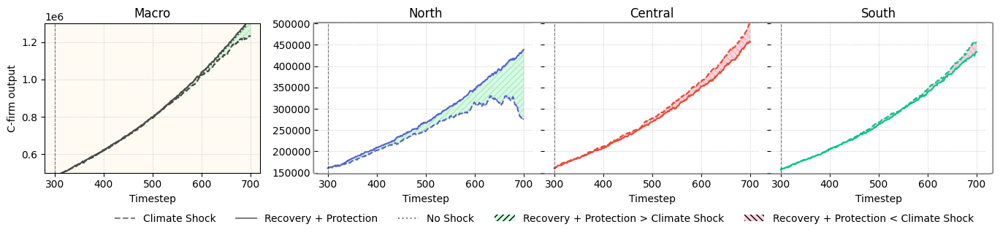

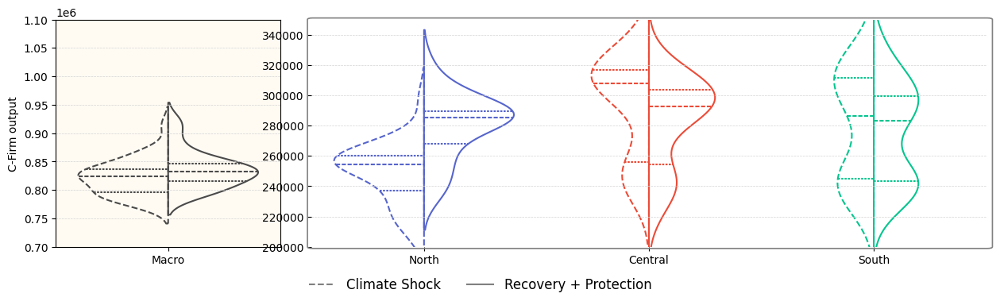

In [177]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:

    compare_regional_metric(
    metric="Q2tot",
    metric_label="C-firm output",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num=scenario_num,
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=1,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
    ylim_macro=(0.5e6, 1.3e6),
    ylim_regional=(0.15e6, 0.5e6)
)
    plot_regional_metric_distribution(
        metric="Q2tot",
        metric_label="C-Firm output",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        ylim_macro=(0.7e6, 1.1e6),
        ylim_regional=(0.2e6, 0.35e6),
    )

## k-firm output

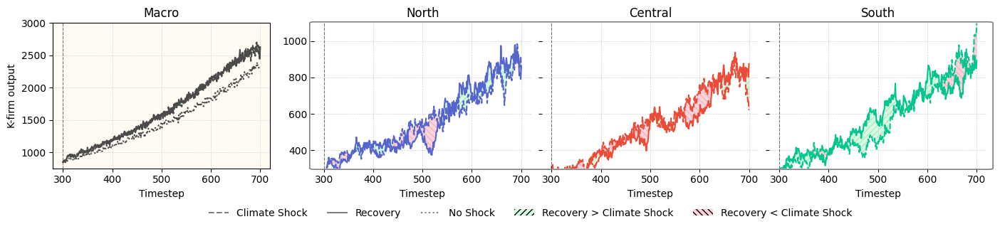

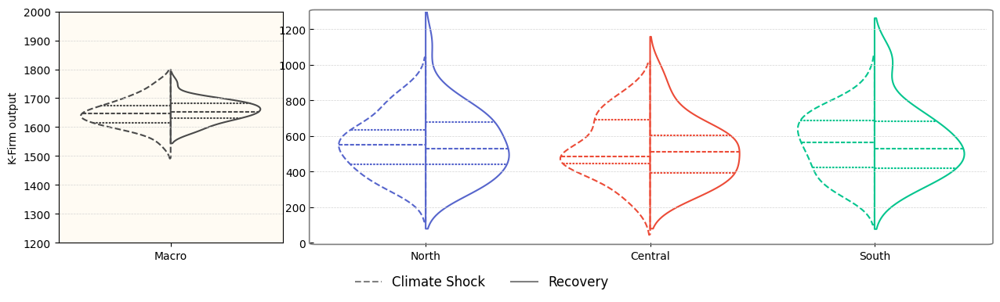

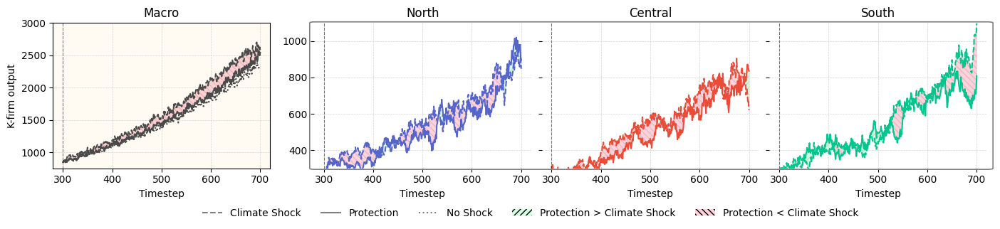

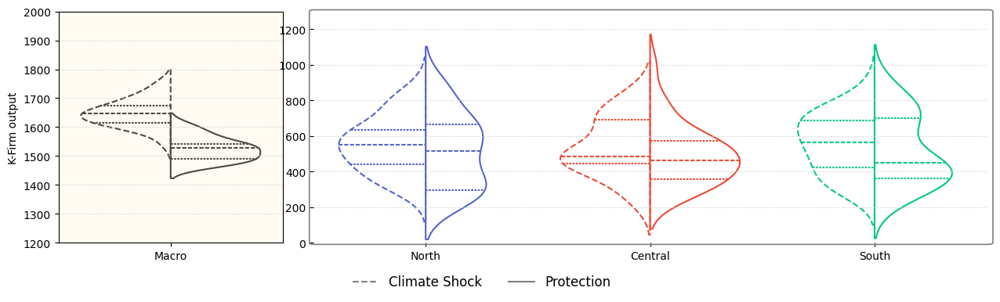

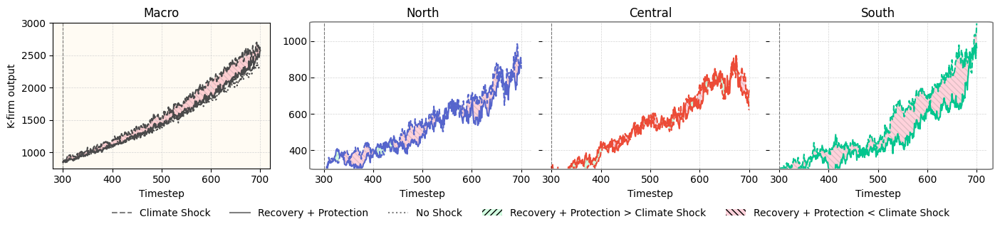

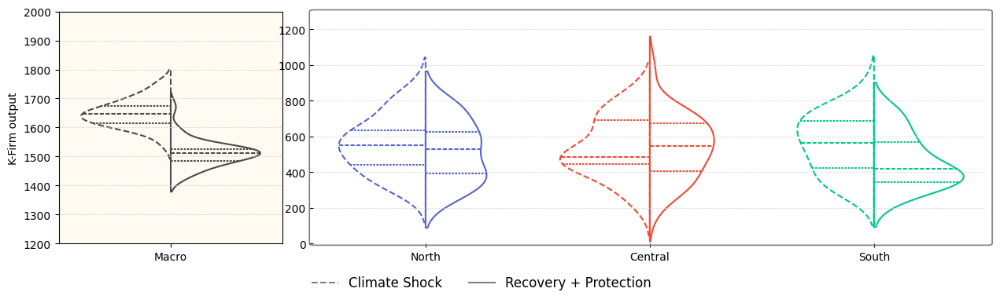

In [178]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:

    compare_regional_metric(
    metric="Q1tot",
    metric_label="K-firm output",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num=scenario_num,
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=1,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
    ylim_macro=(750,3000),
    ylim_regional=(300, 1100),
)
    plot_regional_metric_distribution(
        metric="Q1tot",
        metric_label="K-Firm output",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        ylim_macro=(1200,2000),
        ylim_regional=(0, 1300)
    )

## H1 (k firms)

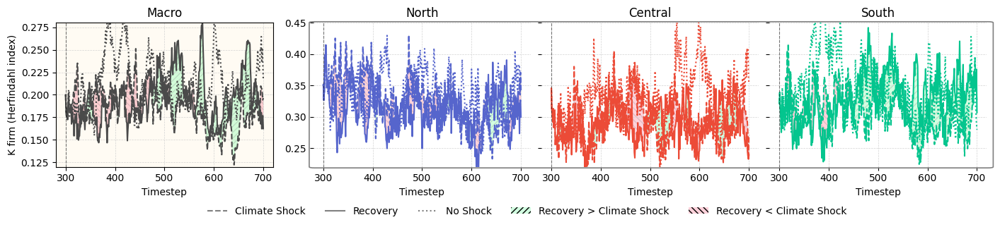

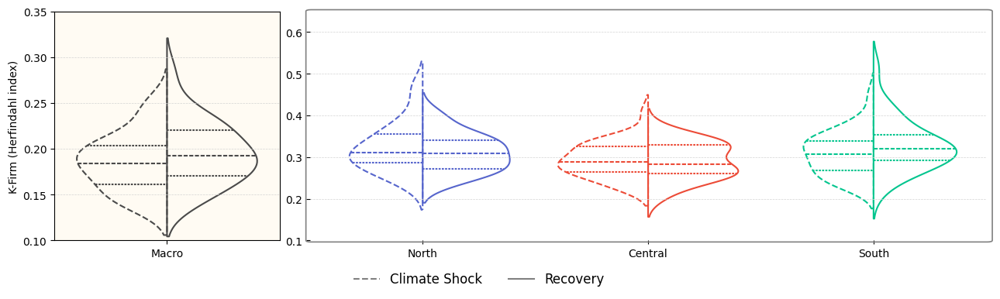

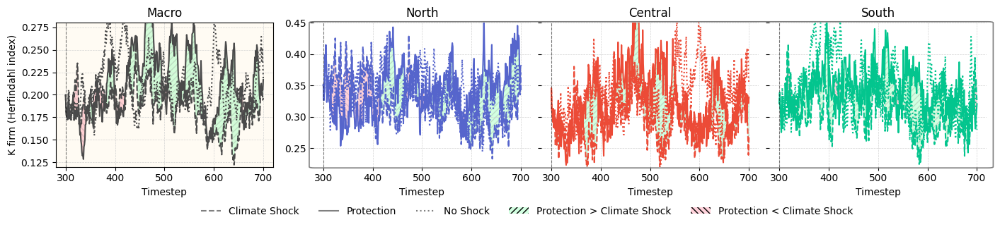

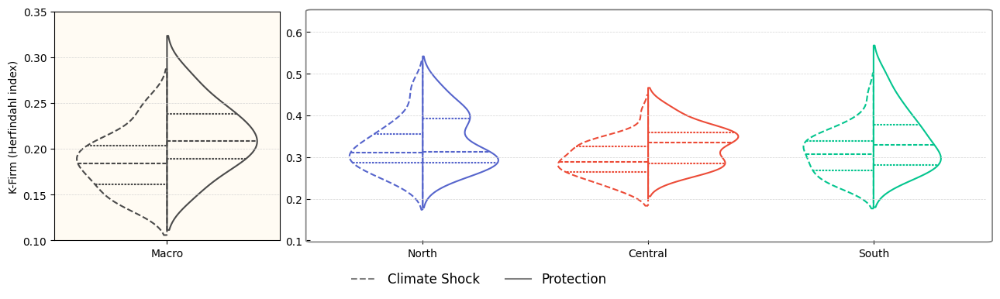

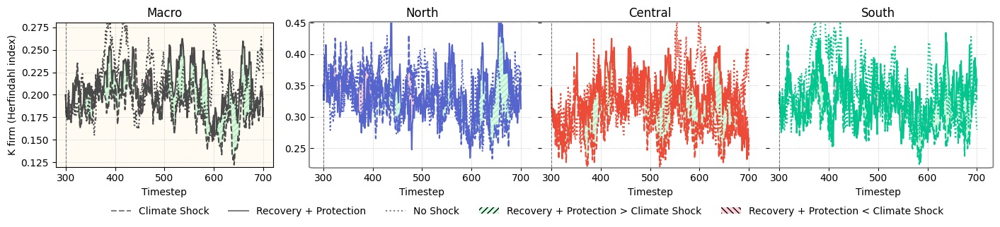

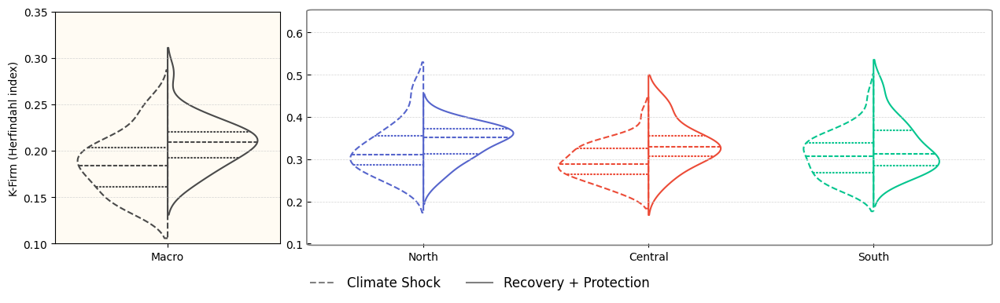

In [179]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:

    compare_regional_metric(
    metric="H1",
    metric_label="K firm (Herfindahl index)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num=scenario_num,
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=1,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
    ylim_macro=(0.12, 0.28),
    ylim_regional=(0.22, 0.45),
)
    plot_regional_metric_distribution(
        metric="H1",
        metric_label="K-Firm (Herfindahl index)",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        ylim_macro=(0.1, 0.35),
        ylim_regional=(0.1, 0.65),
    )

## H2 (c firms)

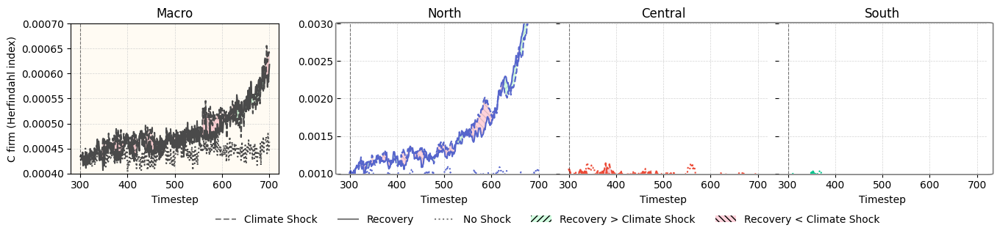

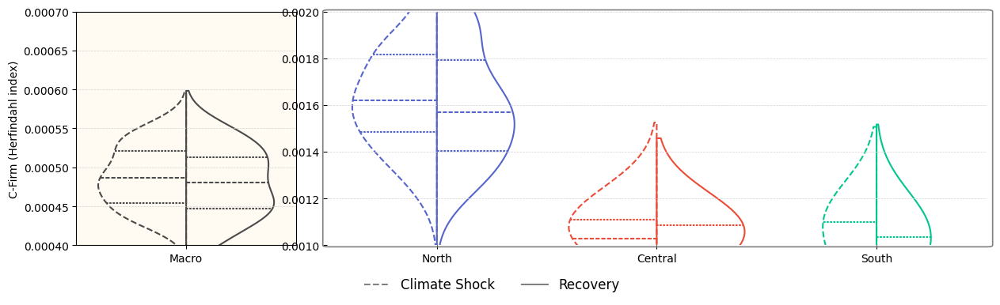

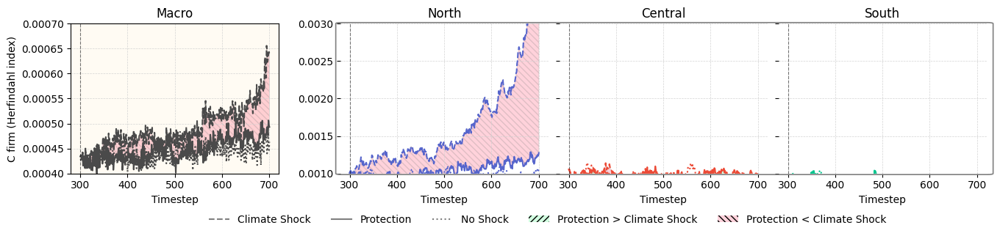

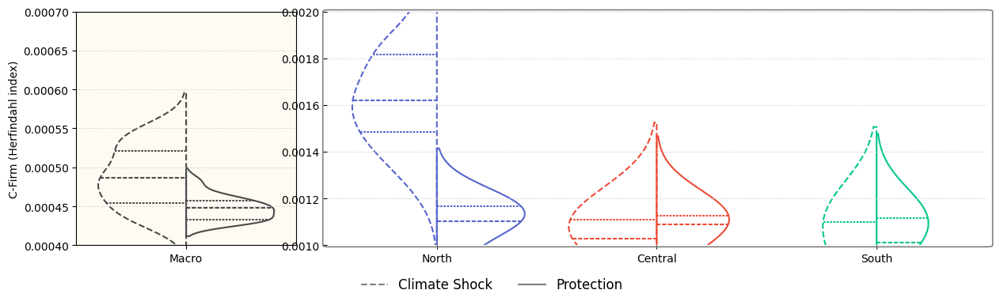

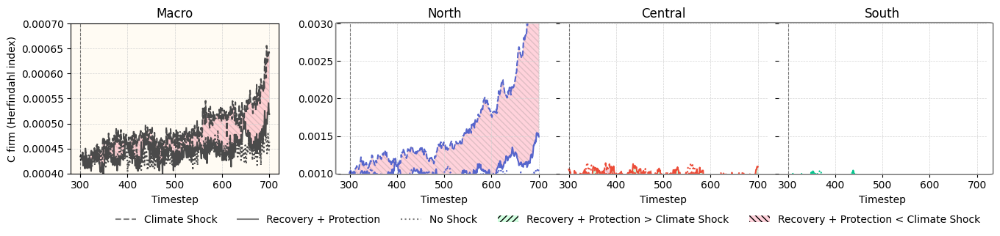

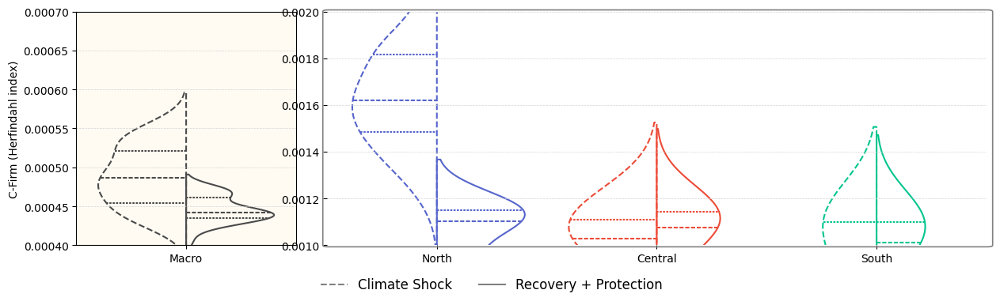

In [180]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:

    compare_regional_metric(
    metric="H2",
    metric_label="C firm (Herfindahl index)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num=scenario_num,
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=1,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
    ylim_macro=(0.4e-3, 0.7e-3),
    ylim_regional=(0.1e-2, 0.3e-2)
)
    plot_regional_metric_distribution(
        metric="H2",
        metric_label="C-Firm (Herfindahl index)",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        ylim_macro=(0.4e-3, 0.7e-3),
        ylim_regional=(0.1e-2, 0.2e-2),
    )

## Emissions

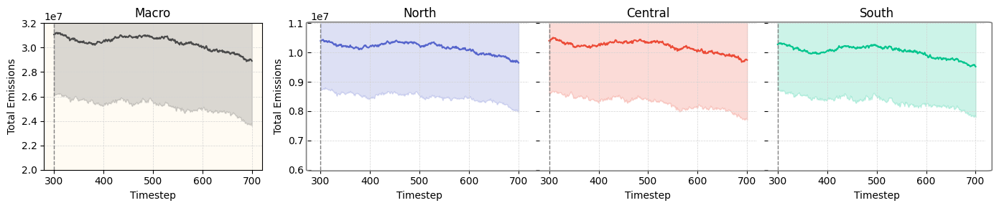

In [181]:


plot_regional_metric(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_1",
    output=OUTPUT,
    share_y_macro=False,
    window=None,
    tmin=300,
    ylim_macro=(2.0e7, 3.2e7),
    ylim_regional=(0.6e7, 1.1e7),
)


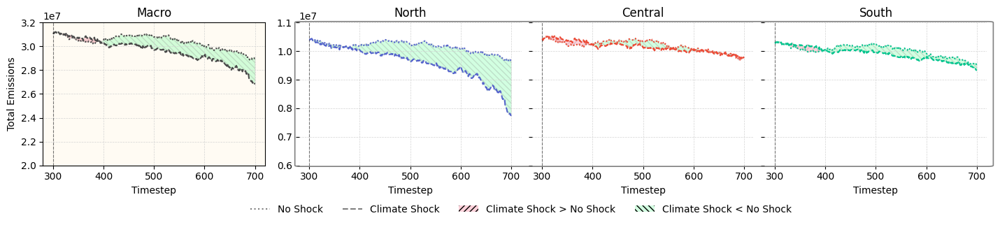

In [182]:
compare_regional_metric(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_1",
    scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=None,
    color_below=green,
    color_above=red,
    ylim_macro=(2.0e7, 3.2e7),
    ylim_regional=(0.6e7, 1.1e7),
)


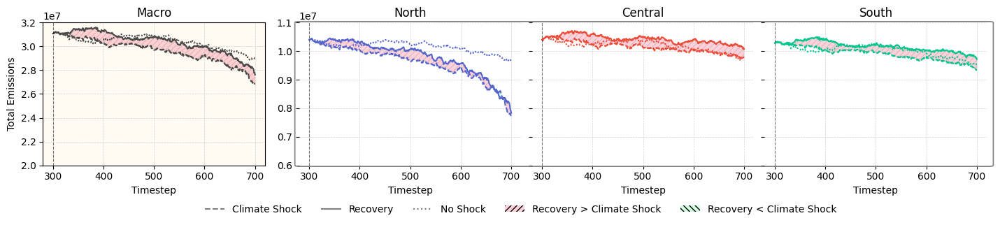

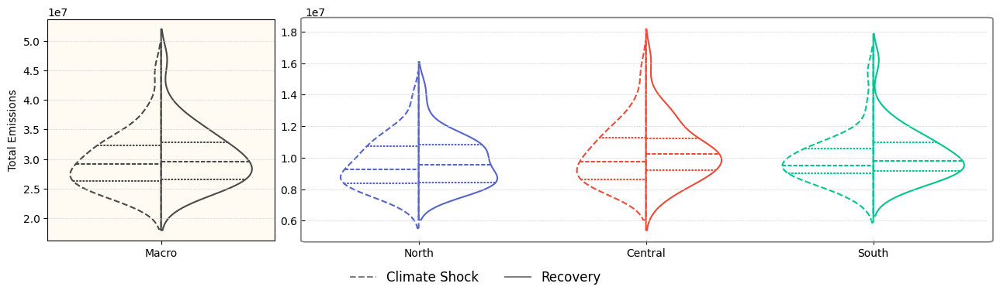

In [183]:
compare_regional_metric(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=None,
    color_below=green,
    color_above=red,
    ylim_macro=(2.0e7, 3.2e7),
    ylim_regional=(0.6e7, 1.1e7),
)

plot_regional_metric_distribution(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    scenario_meta=SCENARIO_META,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    # no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
      
)

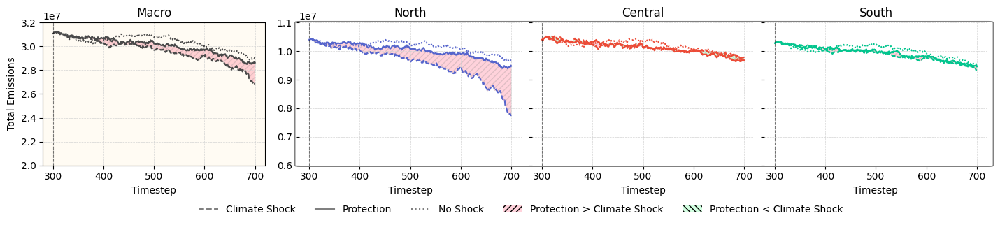

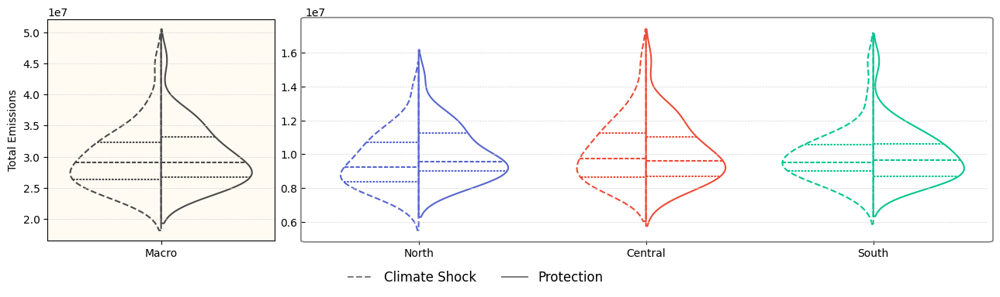

In [184]:
compare_regional_metric(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_4",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=None,
    color_below=green,
    color_above=red,
    ylim_macro=(2.0e7, 3.2e7),
    ylim_regional=(0.6e7, 1.1e7),
)

plot_regional_metric_distribution(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    scenario_meta=SCENARIO_META,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_4",
    # no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    # ylim=(0, None)  
)

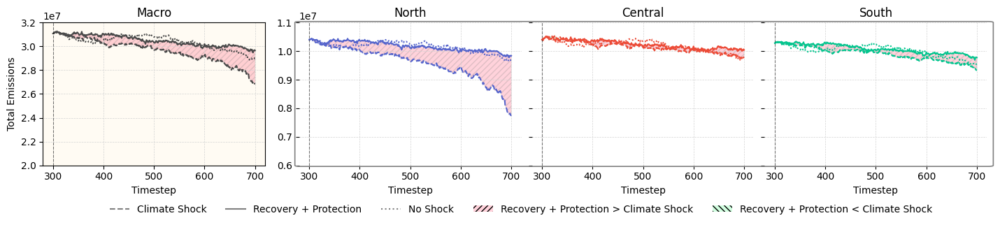

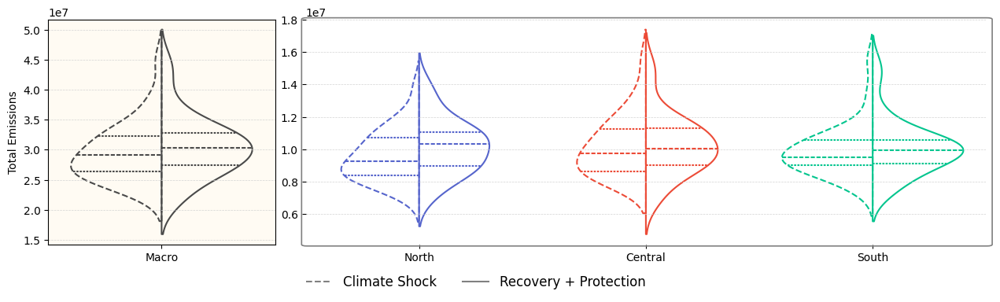

In [185]:
compare_regional_metric(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_5",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=None,
    color_below=green,
    color_above=red,
    ylim_macro=(2.0e7, 3.2e7),
    ylim_regional=(0.6e7, 1.1e7),
)

plot_regional_metric_distribution(
    metric="Emiss_TOT",
    metric_label="Total Emissions",
    scenario_results=scenario_results,
    scenario_meta=SCENARIO_META,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_5",
    # no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    # ylim=(0, None)  
)

## GDP Volatility

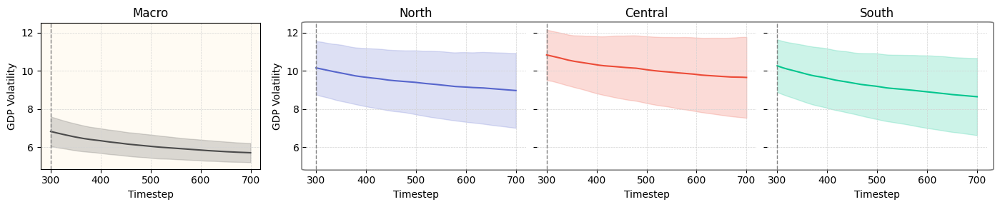

In [186]:
plot_regional_metric(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_1",
    output=OUTPUT,
    share_y_macro=True,
    window=20,
    tmin=300,tmax=700,
)


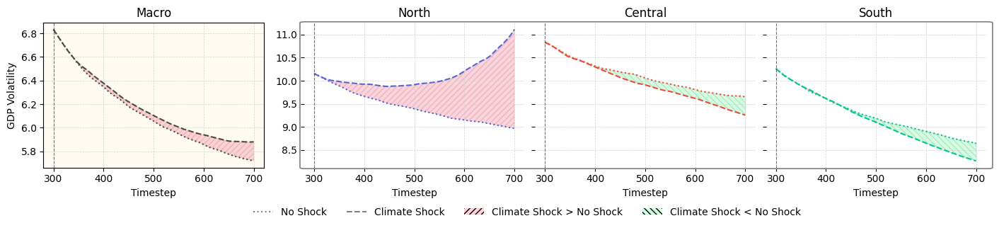

In [187]:
compare_regional_metric(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_1",
    scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

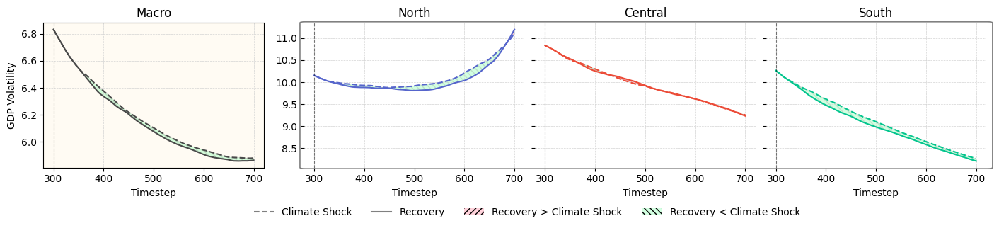

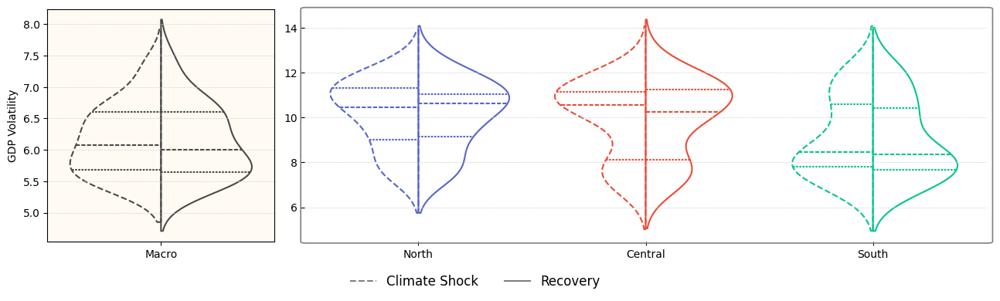

In [188]:
compare_regional_metric(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_3",
    baseline_scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

plot_regional_metric_distribution(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    output=OUTPUT,
    share_y_macro=False,
    # ylim=(5, 20)
)

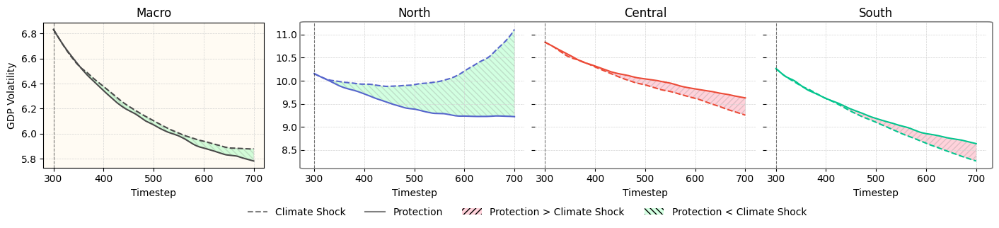

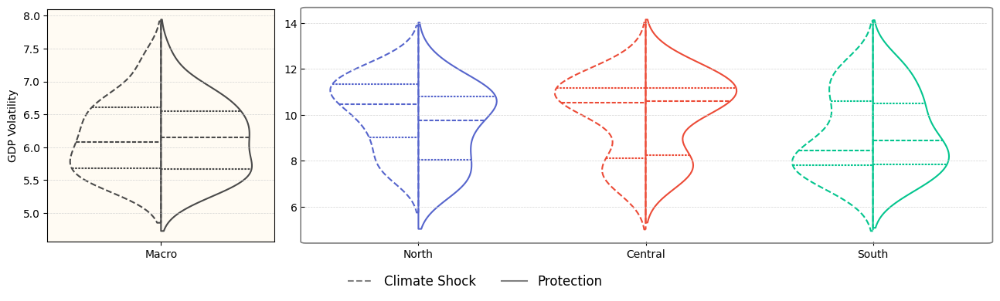

In [189]:
compare_regional_metric(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_4",
    baseline_scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

plot_regional_metric_distribution(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_4",
    output=OUTPUT,
    share_y_macro=False,
    # ylim=(5, 20)
)

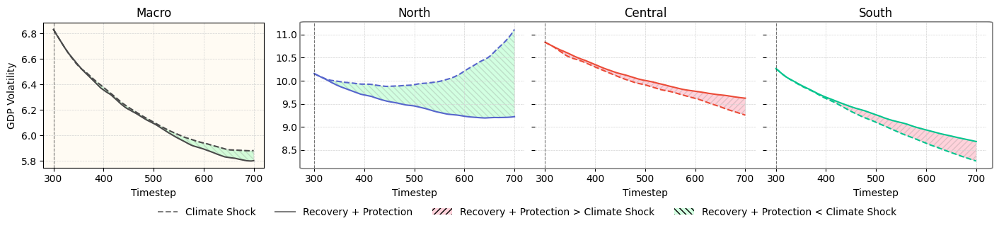

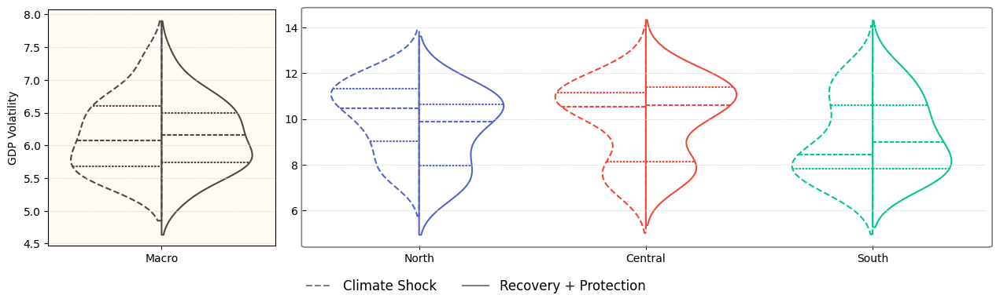

In [190]:
compare_regional_metric(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_5",
    baseline_scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

plot_regional_metric_distribution(
    metric="GDP_r_volatility",
    metric_label="GDP Volatility",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_5",
    output=OUTPUT,
    share_y_macro=False,
    # ylim=(5, 20)
)

## Wage rate

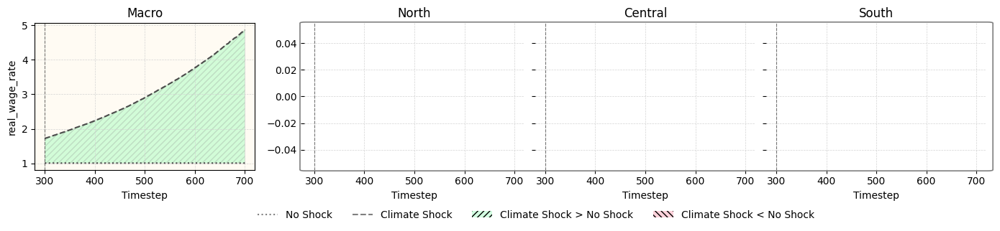

In [191]:
compare_regional_metric(
    metric="real_wage_rate",
    metric_label="real_wage_rate",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_1",
    scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=None,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
)

## Real Wages

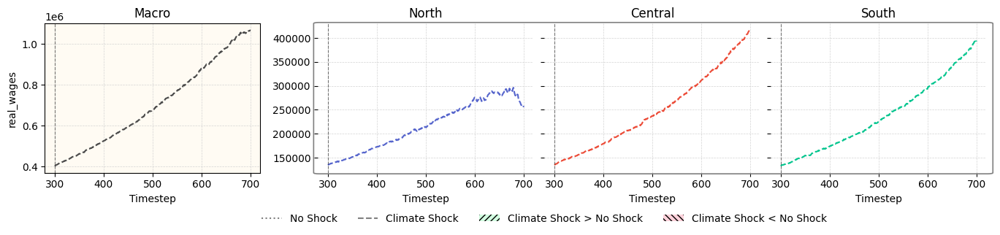

In [192]:
compare_regional_metric(
    metric="real_wages",
    metric_label="real_wages",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_1",
    scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=None,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
)

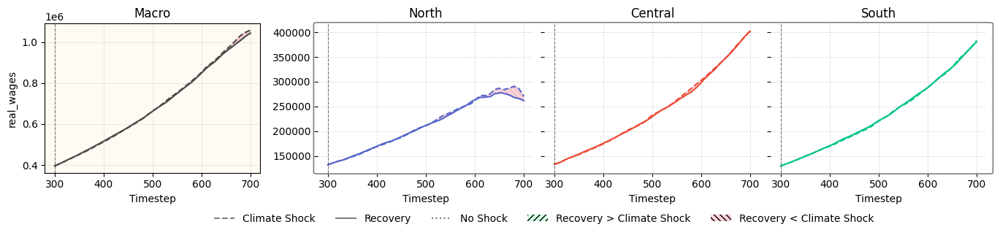

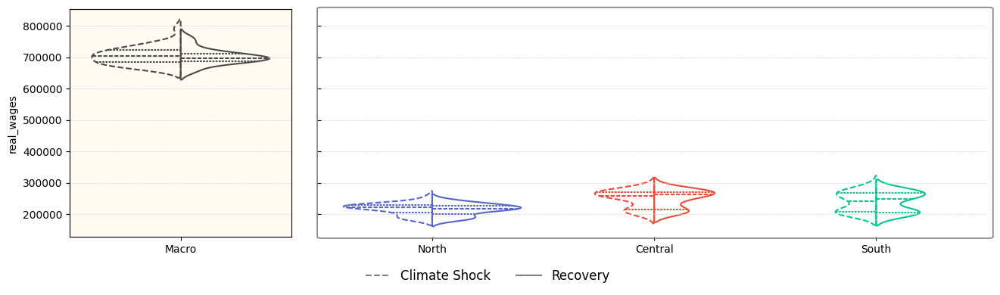

In [193]:
compare_regional_metric(
    metric="real_wages",
    metric_label="real_wages",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
)

plot_regional_metric_distribution(
    metric="real_wages",
    metric_label="real_wages",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    output=OUTPUT,
    share_y_macro=True,
    scenario_meta=SCENARIO_META,
    # ylim=(-0.5, 15),
)

## Unemployment

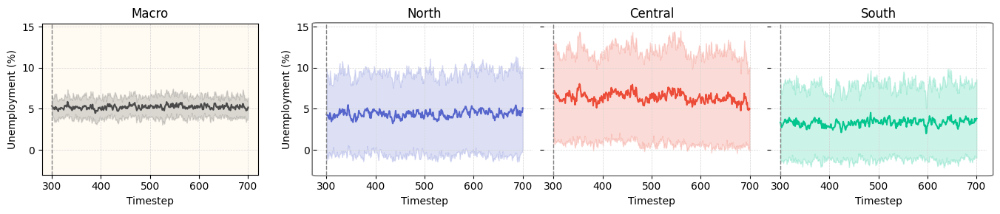

In [194]:


plot_regional_metric(
    metric="Unemployment",
    metric_label="Unemployment (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_1",
    output=OUTPUT,
    share_y_macro=True,
    window=None,
    tmin=300,tmax=700,
    # TODO add Y limit for  0 to 10 
)


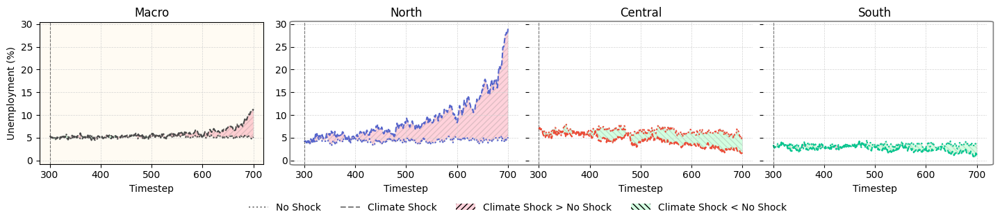

In [195]:
compare_regional_metric(
    metric="Unemployment",
    metric_label="Unemployment (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_1",
    scenario_num="scenario_2",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=None,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

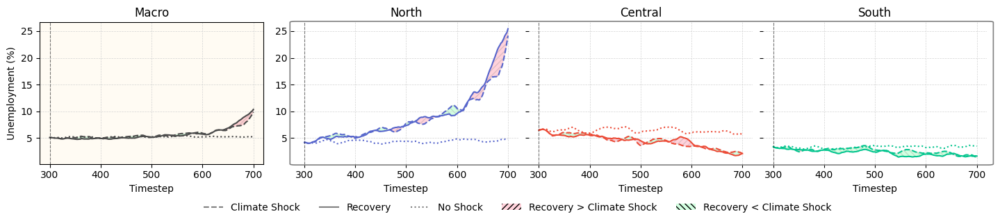

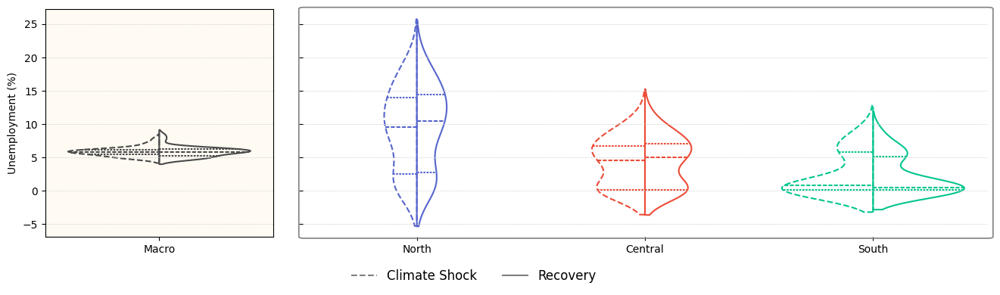

In [196]:
compare_regional_metric(
    metric="Unemployment",
    metric_label="Unemployment (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    no_shock_scenario_num="scenario_1",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

plot_regional_metric_distribution(
    metric="Unemployment",
    metric_label="Unemployment (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    output=OUTPUT,
    share_y_macro=True,
    scenario_meta=SCENARIO_META,
    # ylim=(-0.5, 15),
)

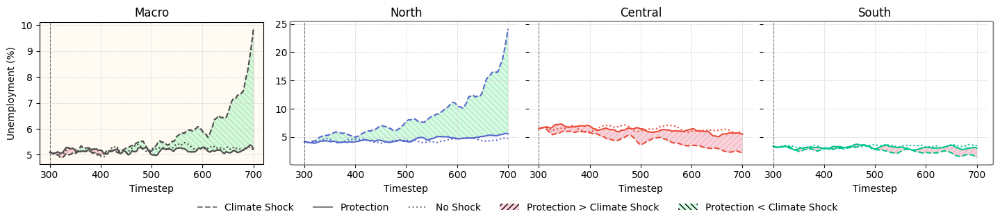

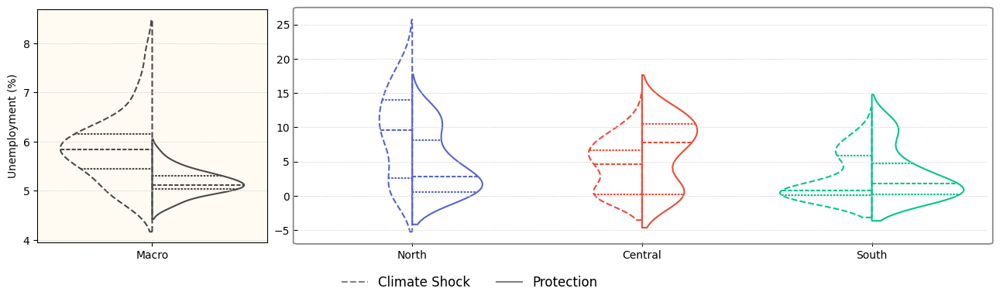

In [197]:
compare_regional_metric(
    metric="Unemployment",
    metric_label="Unemployment (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_4",
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

plot_regional_metric_distribution(
    metric="Unemployment",
    metric_label="Unemployment (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_4",
    output=OUTPUT,
    share_y_macro=False,
    # ylim=(5, 20)
)

## GDP Growth

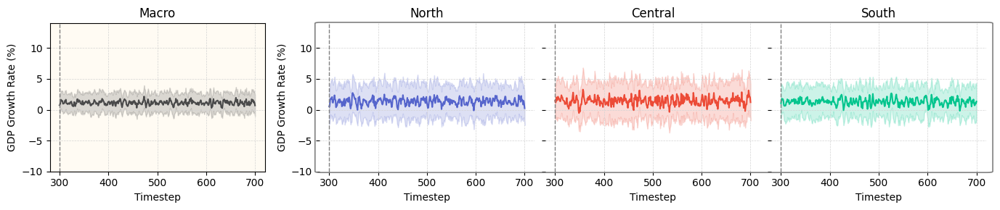

In [198]:


plot_regional_metric(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_1",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,tmax=700,
    window=4,
    ylim_macro=(-10, 14),
    ylim_regional=(-10, 14),
    ci_std=0.35

)


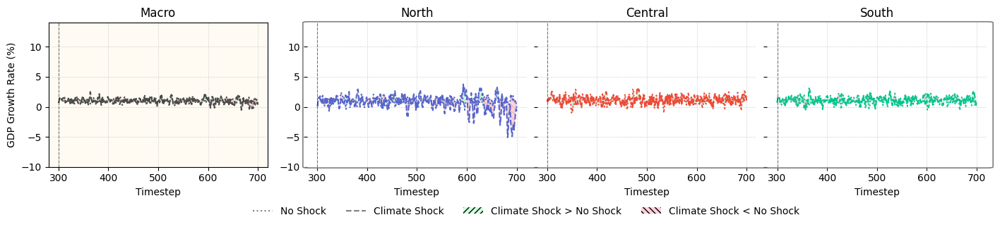

In [199]:
compare_regional_metric(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_1",
    scenario_num="scenario_2",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=4,
    color_below=red,
    color_above=green,
    ylim_macro=(-10, 14),
    ylim_regional=(-10, 14),
)

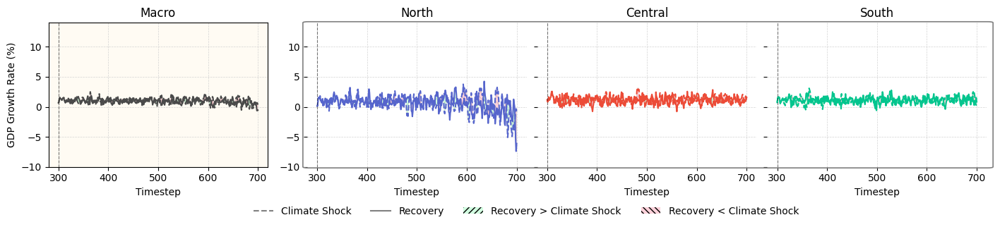

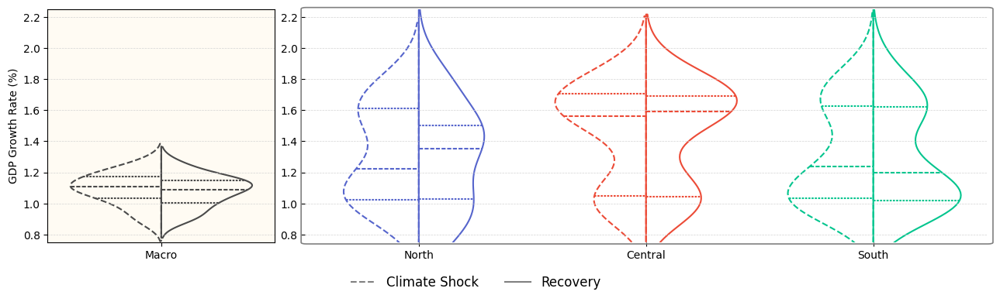

In [200]:
compare_regional_metric(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=4,
    color_below=red,
    color_above=green,
    ylim_macro=(-10, 14),
    ylim_regional=(-10, 14),
)

plot_regional_metric_distribution(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    output=OUTPUT,
    scenario_meta=SCENARIO_META,
    ylim_macro=(0.75, 2.25),
    ylim_regional=(0.75, 2.25),
)

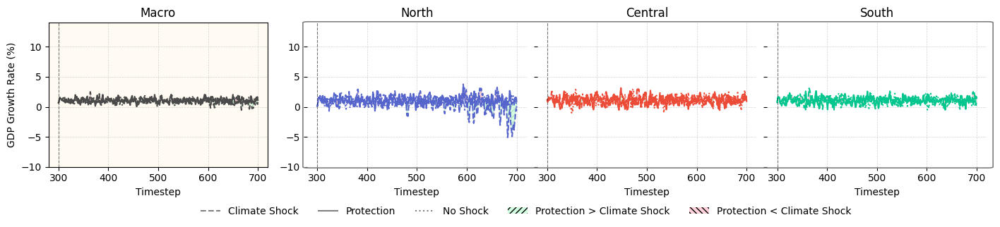

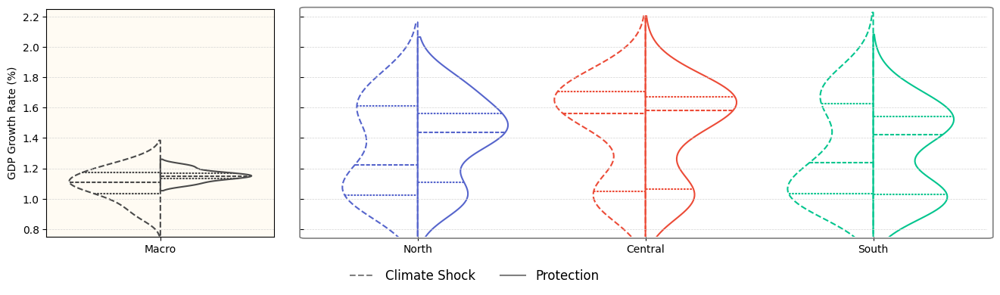

In [201]:
compare_regional_metric(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_4",
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=4,
    color_below=red,
    color_above=green,
    ylim_macro=(-10, 14),
    ylim_regional=(-10, 14),
)

plot_regional_metric_distribution(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_4",
    output=OUTPUT,
    share_y_macro=True,
    ylim_macro=(0.75, 2.25),
    ylim_regional=(0.75, 2.25),
)

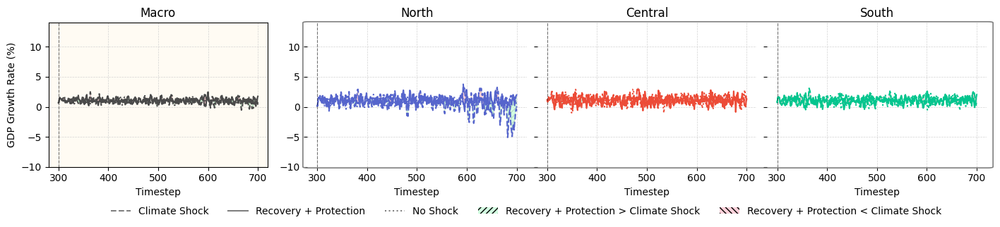

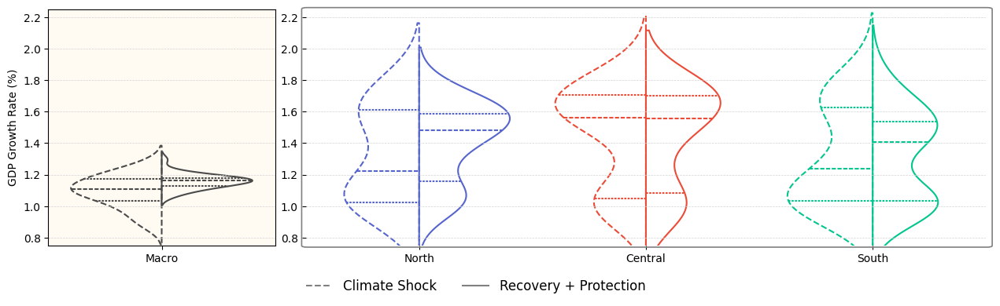

In [202]:
compare_regional_metric(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_5",
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=4,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
    ylim_macro=(-10, 14),
    ylim_regional=(-10, 14),
)

plot_regional_metric_distribution(
    metric="GDP_r_growth",
    metric_label="GDP Growth Rate (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_5",
    output=OUTPUT,
    share_y_macro=False,
    ylim_macro=(0.75, 2.25),
    ylim_regional=(0.75, 2.25),
)

## GDP Growth Rate per capita

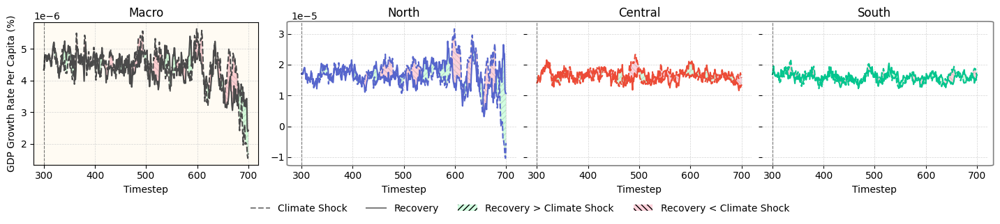

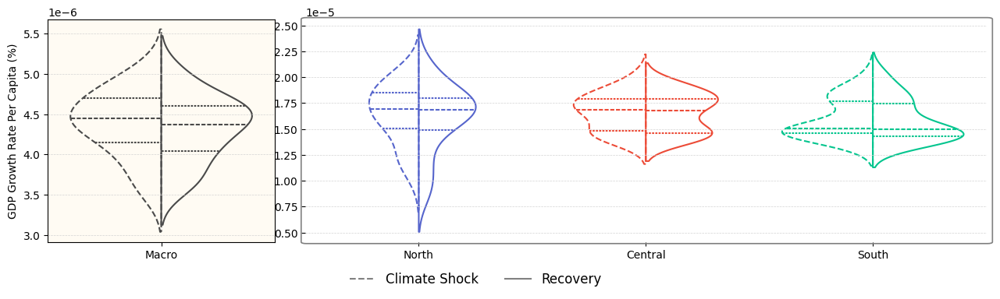

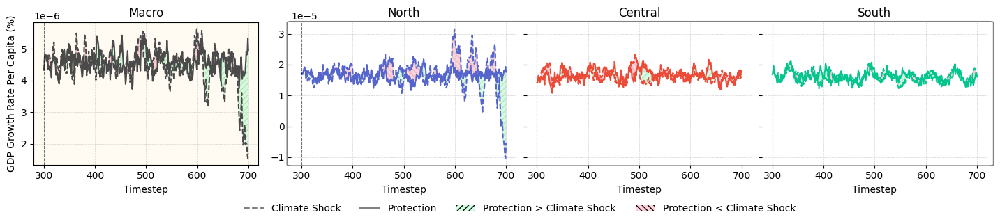

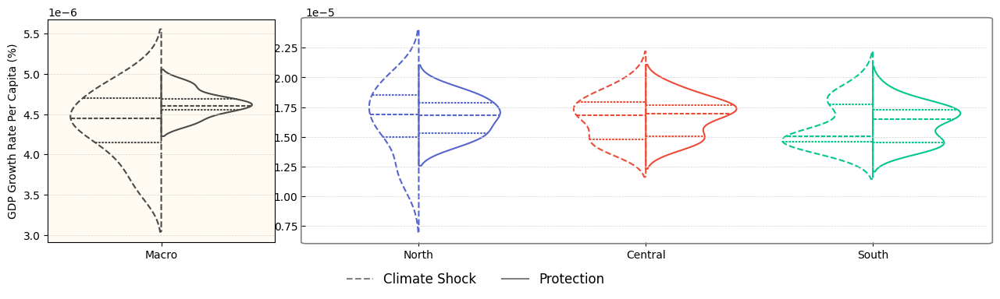

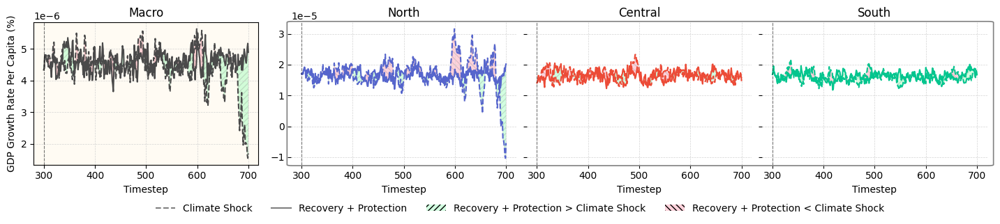

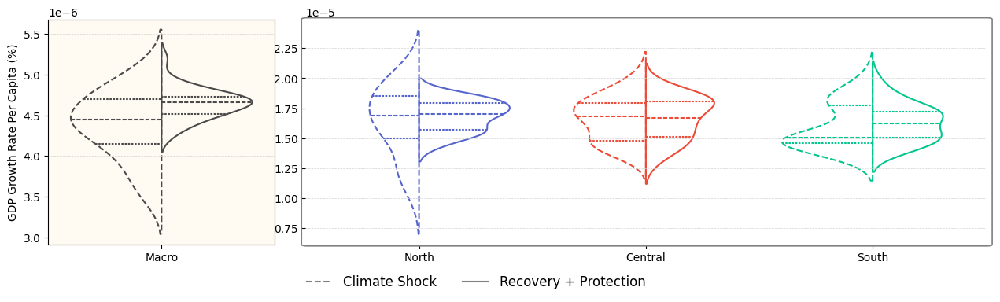

In [203]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:
    compare_regional_metric(
        metric="GDP_r_growth_per_capita",
        metric_label="GDP Growth Rate Per Capita (%)",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_num=scenario_num,
        baseline_scenario_num="scenario_2",
        # no_shock_scenario_num="scenario_1",
        share_y_macro=False,
        output=OUTPUT,
        tmin=300,
        window=20,
        # color above baseline should be red-orange and below should be mint green
        color_below=red,
        color_above=green,

    )

    plot_regional_metric_distribution(
        metric="GDP_r_growth_per_capita",
        metric_label="GDP Growth Rate Per Capita (%)",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        # ylim=(5, 20)
    )

## GDP

In [204]:
def plot_policy_deviation(
    metric,
    scenario_results,
    baseline_scenario,
    policy_scenarios,
    scenario_meta,
    region="macro",
    metric_label=None,
    window=20,
    tmin=300,
    tmax=700,
    deviation="percent",
    output=None,
    title=None,
):
    """Plot percentage/absolute/ratio deviation of policy scenarios from a baseline.

    Parameters
    ----------
    metric : str
        Column name in scenario_results DataFrames.
    scenario_results : dict
        Mapping of scenario name -> DataFrame.
    baseline_scenario : str
        Key into scenario_results for the baseline scenario.
    policy_scenarios : list of str
        Keys into scenario_results for policy scenarios to compare.
    scenario_meta : dict
        Mapping of scenario name -> {"name": ..., "color": ..., "linestyle": ...}.
    region : str or int
        Region to filter on. Defaults to "macro".
    metric_label : str, optional
        Y-axis label. Auto-generated if None.
    window : int
        Rolling-mean smoothing window applied to level series before deviation.
    tmin : int
        Minimum timestep to display.
    tmax : int
        Maximum timestep to display.
    deviation : str
        One of "percent", "absolute", or "ratio".
    output : Path, optional
        If provided, saves PNG to output / f"policy_deviation_{metric}.png".
    title : str, optional
        Plot title. Auto-generated if None.
    """
    import matplotlib.pyplot as plt

    RATE_METRICS = {"GDP_r_growth"}
    LEVEL_MAP = {"GDP_r_growth": "GDP_r"}

    if deviation not in {"percent", "absolute", "ratio"}:
        raise ValueError("deviation must be one of: 'percent', 'absolute', 'ratio'")

    if metric_label is None:
        if deviation == "percent":
            metric_label = f"{metric} deviation from {scenario_meta[baseline_scenario]['name']} (%)"
        elif deviation == "ratio":
            metric_label = f"{metric} ratio to {scenario_meta[baseline_scenario]['name']}"
        else:
            metric_label = f"{metric} difference from {scenario_meta[baseline_scenario]['name']}"

    if title is None:
        title = metric_label

    def _get_series(snum):
        df = scenario_results[snum]
        df_reg = df[df["region"] == region]

        if metric in RATE_METRICS and metric in LEVEL_MAP:
            level_col = LEVEL_MAP[metric]
            df_agg = (
                df_reg.groupby("t")[level_col]
                .mean()
                .reset_index()
            )
            df_agg = df_agg.sort_values("t")
            df_agg[metric] = (
                ((df_agg[level_col] / df_agg[level_col].shift(1)) ** 4 - 1) * 100
            )
        else:
            df_agg = (
                df_reg.groupby("t")[metric]
                .mean()
                .reset_index()
            )

        # Apply rolling mean on full series before time filter
        df_agg[metric] = df_agg[metric].rolling(window=window, min_periods=1).mean()

        # Apply time filter after rolling mean
        df_agg = df_agg[(df_agg["t"] >= tmin) & (df_agg["t"] <= tmax)]

        return df_agg.set_index("t")[metric]

    base_series = _get_series(baseline_scenario)

    fig, ax = plt.subplots(figsize=(10, 4))

    for s_num in policy_scenarios:
        scen_series = _get_series(s_num)

        if deviation == "percent":
            dev = ((scen_series - base_series) / base_series.abs()) * 100
        elif deviation == "ratio":
            dev = scen_series / base_series
        else:
            dev = scen_series - base_series

        ax.plot(
            dev.index,
            dev.values,
            label=scenario_meta[s_num]["name"],
            color=scenario_meta[s_num]["color"],
            linestyle=scenario_meta[s_num]["linestyle"],
            linewidth=scenario_meta[s_num].get("linewidth", 1.5),
        )

    # Zero line = baseline
    ax.axhline(
        0 if deviation != "ratio" else 1,
        color="gray",
        linestyle=scenario_meta[baseline_scenario]["linestyle"],
        linewidth=1.2,
        label=scenario_meta[baseline_scenario]["name"],
        alpha=0.7,
    )

    if tmin > 0:
        ax.axvline(
            x=tmin,
            color="black",
            linestyle="--",
            linewidth=0.8,
            alpha=0.5,
            label="_nolegend_",
        )

    ax.set_xlabel("Timestep")
    ax.set_ylabel(metric_label)
    ax.set_title(title)
    ax.grid(True, color="lightgray", linestyle="--", linewidth=0.5)
    ax.spines[["top", "right"]].set_visible(False)
    ax.legend(frameon=False, loc="lower center", fontsize=10, ncol=len(policy_scenarios) + 1, bbox_to_anchor=(0.5, -0.3), framealpha=0)
    plt.tight_layout()

    if output is not None:
        plt.savefig(
            output / f"policy_deviation_{metric}.png",
            dpi=300,
            bbox_inches="tight",
        )

    plt.show()

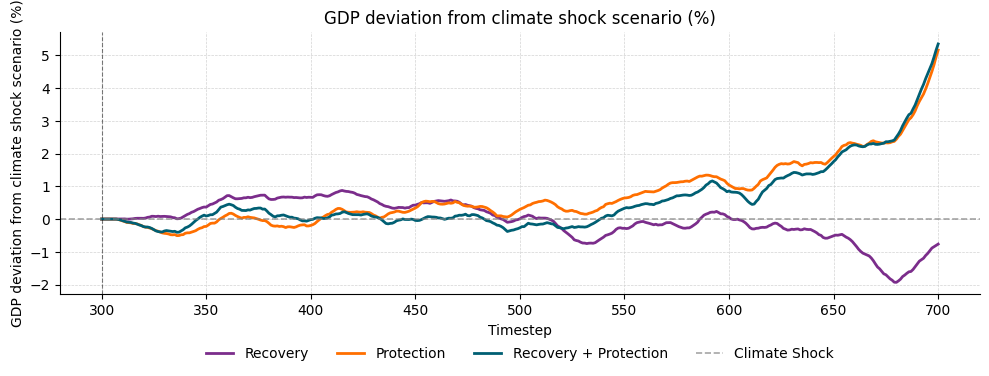

In [205]:
plot_policy_deviation(
    metric="GDP_r",
    metric_label="GDP deviation from climate shock scenario (%)",
    scenario_results=scenario_results,
    baseline_scenario="scenario_2",
    policy_scenarios=["scenario_3", "scenario_4", "scenario_5"],
    scenario_meta=SCENARIO_META,
    region="macro",
    deviation="percent",
    window=20,
    tmin=300,
    tmax=700,
    output=OUTPUT,
)

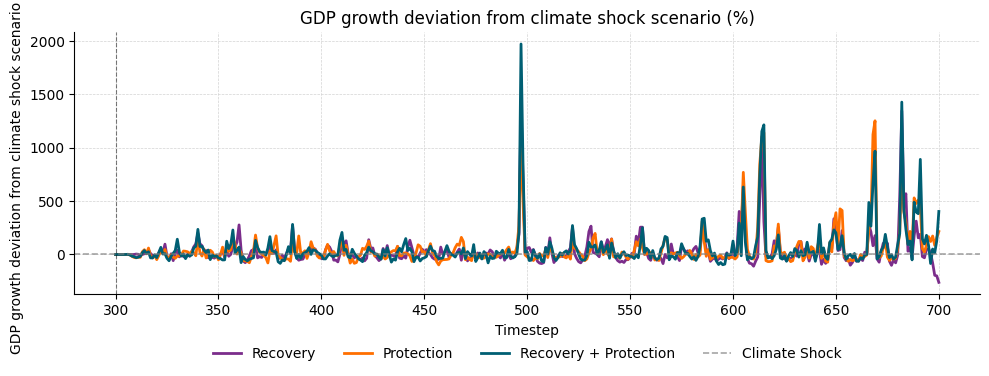

In [206]:
plot_policy_deviation(
    metric="GDP_r_growth",
    metric_label="GDP growth deviation from climate shock scenario (%)",
    scenario_results=scenario_results,
    baseline_scenario="scenario_2",
    policy_scenarios=["scenario_3", "scenario_4", "scenario_5"],
    scenario_meta=SCENARIO_META,
    region="macro",
    deviation="percent",
    window=4,
    tmin=300,
    tmax=700,
    output=OUTPUT,
)

In [207]:
def plot_scenario_distribution_comparison(
    metrics,
    scenario_results,
    baseline_scenario,
    policy_scenarios,
    scenario_meta,
    region="macro",
    metric_labels=None,
    tmin=300,
    tmax=700,
    output=None,
    title=None,
):
    """Plot run-level mean distributions of metrics across policy scenarios.

    Displays a horizontal violin plot for each metric, comparing policy scenarios
    against a baseline. Each violin represents the distribution of
    per-run time-averaged values.

    Parameters
    ----------
    metrics : list of str
        Column names to plot. One subplot per metric.
    scenario_results : dict
        Mapping of scenario name -> DataFrame.
    baseline_scenario : str
        Key into scenario_results for the baseline (shown at top).
    policy_scenarios : list of str
        Keys into scenario_results for policy scenarios to compare.
    scenario_meta : dict
        Mapping of scenario name -> {"name": ..., "color": ..., "linestyle": ...}.
    region : str or int
        Region to filter on. Defaults to "macro".
    metric_labels : dict, optional
        Mapping of metric name -> x-axis label. Defaults to metric name.
    tmin : int
        Minimum timestep to include in run-level mean.
    tmax : int
        Maximum timestep to include in run-level mean.
    output : Path, optional
        If provided, saves PNG to output / "scenario_distribution_{metrics}.png".
    title : str, optional
        Overall figure title.
    """
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.ticker as mticker
    from matplotlib.lines import Line2D

    if metric_labels is None:
        metric_labels = {m: m for m in metrics}

    RATE_METRICS = {"GDP_r_growth"}
    LEVEL_MAP = {"GDP_r_growth": "GDP_r"}

    # Reversed so baseline ends up at the highest position (top of y-axis)
    all_scenarios = list(reversed([baseline_scenario] + policy_scenarios))

    def _get_run_means(snum, metric):
        df = scenario_results[snum]
        df_reg = df[df["region"] == region].copy()
        df_reg = df_reg[(df_reg["t"] >= tmin) & (df_reg["t"] <= tmax)]

        if metric in RATE_METRICS and metric in LEVEL_MAP:
            level_col = LEVEL_MAP[metric]
            df_reg = df_reg.sort_values(["run", "t"])
            df_reg[metric] = df_reg.groupby("run")[level_col].transform(
                lambda x: ((x / x.shift(1)) ** 4 - 1) * 100
            )
            df_reg = df_reg.dropna(subset=[metric])
            col = metric
        else:
            col = metric

        run_means = (
            df_reg.groupby("run")[col]
            .mean()
            .reset_index()
        )
        run_means.columns = ["run", "value"]
        run_means["scenario"] = scenario_meta[snum]["name"]
        run_means["scenario_key"] = snum
        return run_means

    n_metrics = len(metrics)
    fig, axs = plt.subplots(
        1, n_metrics,
        figsize=(6 * n_metrics, max(4, len(all_scenarios) * 1.2)),
        sharey=True,
    )
    if n_metrics == 1:
        axs = [axs]

    for ax, metric in zip(axs, metrics):

        all_data = pd.concat(
            [_get_run_means(snum, metric) for snum in all_scenarios],
            ignore_index=True,
        )

        for pos, snum in enumerate(all_scenarios):
            data = all_data[all_data["scenario_key"] == snum]["value"].dropna().values

            if len(data) == 0:
                continue

            color = scenario_meta[snum]["color"]
            linestyle = scenario_meta[snum]["linestyle"]

            parts = ax.violinplot(
                data,
                positions=[pos],
                vert=False,
                showmedians=True,
                quantiles=[0.25, 0.75],
                widths=0.6,
            )

            for pc in parts["bodies"]:
                pc.set_facecolor("none")
                pc.set_edgecolor(color)
                pc.set_linewidth(2)
                pc.set_linestyle(linestyle)
                pc.set_alpha(1)

            for key in ["cmedians", "cquantiles", "cmins", "cmaxes", "cbars"]:
                if key in parts:
                    parts[key].set_color(color)
                    parts[key].set_linewidth(1.5)

        baseline_median = (
            all_data[all_data["scenario_key"] == baseline_scenario]["value"].median()
        )
        ax.axvline(
            baseline_median,
            color=scenario_meta[baseline_scenario]["color"],
            linestyle="--",
            linewidth=1.2,
            alpha=0.7,
            label=f"{scenario_meta[baseline_scenario]['name']} median",
        )

        ax.set_xlabel(metric_labels.get(metric, metric))
        ax.set_ylabel("")
        ax.xaxis.set_major_locator(mticker.MaxNLocator(5))
        _max_val = all_data["value"].dropna().abs().max()
        if _max_val < 0.1:
            ax.xaxis.set_major_formatter(
                mticker.FuncFormatter(lambda x, _: f"{x * 1:.4g}")
            )
        elif _max_val > 10_000:
            _fmt = mticker.ScalarFormatter(useMathText=False)
            _fmt.set_scientific(True)
            _fmt.set_powerlimits((0, 0))
            ax.xaxis.set_major_formatter(_fmt)
        ax.tick_params(axis="x", rotation=30)
        ax.grid(True, color="lightgray", linestyle="--", linewidth=0.5, axis="x")
        ax.spines[["top", "right"]].set_visible(False)

    # Set y-tick labels once on the shared axis via the first subplot;
    # use tick_params to hide them on remaining subplots without wiping the shared labels.
    axs[0].set_yticks(list(range(len(all_scenarios))))
    axs[0].set_yticklabels(
        [scenario_meta[s]["name"] for s in all_scenarios],
        fontsize=10,
    )
    for ax in axs[1:]:
        ax.tick_params(labelleft=False)

    legend_handles = [
        Line2D(
            [0], [0],
            color=scenario_meta[s]["color"],
            linestyle=scenario_meta[s]["linestyle"],
            linewidth=2,
            label=scenario_meta[s]["name"],
        )
        for s in all_scenarios
    ]

    fig.legend(
        handles=legend_handles,
        loc="lower center",
        ncol=len(all_scenarios),
        frameon=False,
        bbox_to_anchor=(0.5, -0.08),
        fontsize=10,
    )

    if title is not None:
        fig.suptitle(title, fontsize=13, y=1.02)

    plt.tight_layout()

    if output is not None:
        metric_str = "_".join(metrics)
        plt.savefig(
            output / f"scenario_distribution_{metric_str}.png",
            dpi=300,
            bbox_inches="tight",
        )

    plt.show()


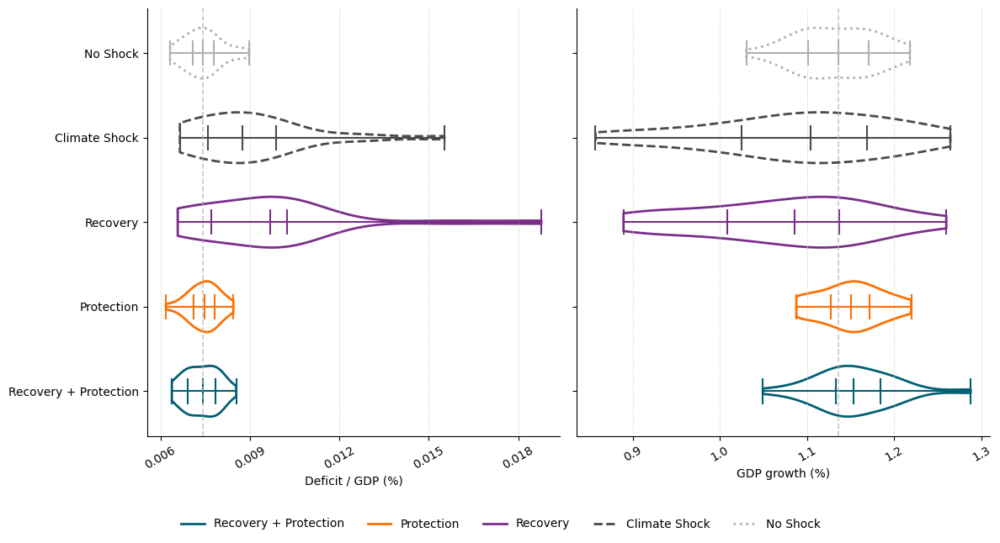

In [208]:
plot_scenario_distribution_comparison(
    metrics=["Deficit", "GDP_r_growth"],
    scenario_results=scenario_results,
    baseline_scenario="scenario_1",
    policy_scenarios=["scenario_2", "scenario_3", "scenario_4", "scenario_5"],
    scenario_meta=SCENARIO_META,
    region="macro",
    metric_labels={
        "Deficit": "Deficit / GDP (%)",
        "GDP_r_growth":            "GDP growth (%)",
    },
    tmin=300,
    tmax=700,
    # title="Distribution of Run-Level Means across Policy Scenarios",
    output=OUTPUT,
)

## Deficit

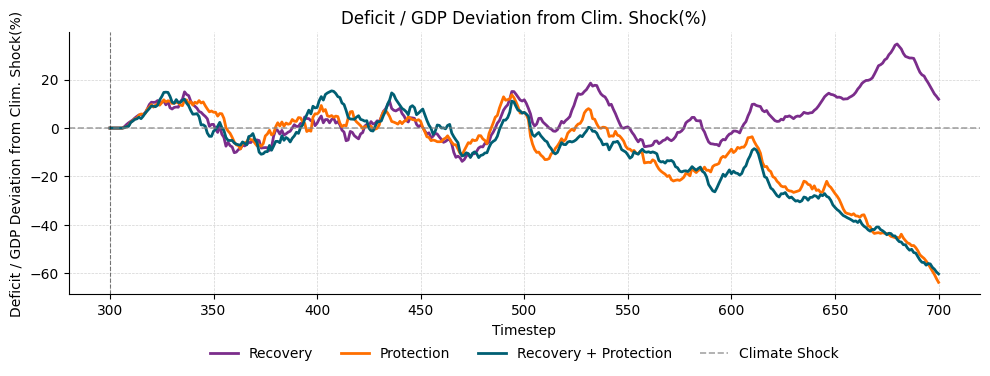

In [209]:
plot_policy_deviation(
    metric="Deficit",
    metric_label="Deficit / GDP Deviation from Clim. Shock(%)",
    scenario_results=scenario_results,
    baseline_scenario="scenario_2",
    policy_scenarios=["scenario_3", "scenario_4", "scenario_5"],
    scenario_meta=SCENARIO_META,
    region="macro",
    deviation="percent",
    window=20,
    tmin=300,
    tmax=700,
    output=OUTPUT,
)

## Regional Inequality in GDP Contribution

### Scenario 5

In [210]:
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# ── Shared metadata ─────────────────────────────────────────────────────────────
region_meta = {
    "macro": {"name": "Macro",   "color": "#343434"},
    1:       {"name": "North",   "color": "#5665CC"},
    2:       {"name": "Central", "color": "#EC4B37"},
    3:       {"name": "South",   "color": "#03C58E"},
}

green = "#4dff88"
red   = "#ff4d73"

# ── Global plot parameters ───────────────────────────────────────────────────────
window    = 20
tmin_plot = 0
tmax_plot = 700
real_regions = [r for r in region_meta if r != "macro"]
N = len(real_regions)

# ── Computation helpers ──────────────────────────────────────────────────────────
def _compute_cv(scenario_key, window=20, tmin=0, tmax=700):
    """CV of GDP_r across regions at each t (Monte-Carlo averaged, then smoothed)."""
    df = scenario_results[scenario_key]
    df_r = (
        df[df["region"].isin(real_regions)]
        .groupby(["t", "region"])["GDP_r"]
        .mean()
        .reset_index()
    )
    cv = (
        df_r.groupby("t")["GDP_r"]
        .agg(cv=lambda x: x.std() / x.mean())
        .reset_index()
    )
    cv["cv"] = cv["cv"].rolling(window=window, min_periods=1).mean()
    return cv[(cv["t"] >= tmin) & (cv["t"] <= tmax)]


def _compute_share_deviation(scenario_key, window=20, tmin=0, tmax=700):
    """Deviation of each region's GDP share from equal share 1/N (smoothed)."""
    df = scenario_results[scenario_key]
    df_r = (
        df[df["region"].isin(real_regions)]
        .groupby(["t", "region"])["GDP_r"]
        .mean()
        .reset_index()
    )
    df_r["deviation"] = (
        df_r["GDP_r"] / df_r.groupby("t")["GDP_r"].transform("sum") - (1 / N)
    )
    df_r["deviation"] = df_r.groupby("region")["deviation"].transform(
        lambda x: x.rolling(window=window, min_periods=1).mean()
    )
    return df_r[(df_r["t"] >= tmin) & (df_r["t"] <= tmax)]


# ── Plot functions ───────────────────────────────────────────────────────────────
def plot_cv_figure(active_scenario_keys, fill_scenario_a, fill_scenario_b,
                   window=window, tmin=tmin_plot, tmax=tmax_plot):
    """Figure 1: CV of regional GDP over time for the given scenario subset."""
    scenario_meta = {k: SCENARIO_META[k] for k in active_scenario_keys}

    fig, ax = plt.subplots(figsize=(10, 3.5))
    cv_cache = {}
    for s_key, s_meta in scenario_meta.items():
        cv = _compute_cv(s_key, window=window, tmin=tmin, tmax=tmax)
        cv_cache[s_key] = cv
        ax.plot(cv["t"], cv["cv"], color=s_meta["color"], linewidth=1.5,
                linestyle=s_meta["linestyle"], label=s_meta["name"])

    cv_a = cv_cache[fill_scenario_a] if fill_scenario_a in cv_cache else _compute_cv(fill_scenario_a, window=window, tmin=tmin, tmax=tmax)
    cv_b = cv_cache[fill_scenario_b] if fill_scenario_b in cv_cache else _compute_cv(fill_scenario_b, window=window, tmin=tmin, tmax=tmax)
    fill_merged = cv_a[["t", "cv"]].rename(columns={"cv": "cv_a"}).merge(
        cv_b[["t", "cv"]].rename(columns={"cv": "cv_b"}), on="t"
    )
    ax.fill_between(fill_merged["t"], fill_merged["cv_a"], fill_merged["cv_b"],
                    where=(fill_merged["cv_b"] >= fill_merged["cv_a"]),
                    interpolate=True, color="None", alpha=0.15, hatch="////", edgecolor="Gray")
    ax.fill_between(fill_merged["t"], fill_merged["cv_a"], fill_merged["cv_b"],
                    where=(fill_merged["cv_b"] < fill_merged["cv_a"]),
                    interpolate=True, color="None", alpha=0.15, hatch=r"\\\\", edgecolor="Gray")

    ax.axvline(x=300, color="black", linestyle="--", linewidth=0.8, alpha=0.5)
    ax.set_xlabel("Timestep")
    ax.set_ylabel("CV of regional GDP")
    ax.set_title("Regional Inequality — Coefficient of Variation of GDP$_r$ across Regions")
    ax.grid(True, color="lightgray", linestyle="--", linewidth=0.5)
    ax.spines[["top", "right"]].set_visible(False)

    handles, _ = ax.get_legend_handles_labels()
    ax.legend(handles=handles, frameon=False,
              ncol=len(scenario_meta) + 3, fontsize=8, bbox_to_anchor=(0.75, -0.15))
    plt.tight_layout()
    plt.savefig(OUTPUT / f"regional_inequality_cv{fill_scenario_a}_vs_{fill_scenario_b}.png",
                dpi=300, bbox_inches="tight")
    plt.show()


def plot_share_deviation_figure(baseline_key, target_key, no_shock_key="scenario_1",
                                window=window, tmin=tmin_plot, tmax=tmax_plot):
    """Figure 2: GDP share deviation from 1/N per region (baseline vs. target)."""
    base_dev     = _compute_share_deviation(baseline_key, window=window, tmin=tmin, tmax=tmax)
    target_dev   = _compute_share_deviation(target_key,   window=window, tmin=tmin, tmax=tmax)
    no_shock_dev = _compute_share_deviation(no_shock_key, window=window, tmin=tmin, tmax=tmax)

    fig, axs = plt.subplots(1, N, figsize=(12, 3), sharex=True, sharey=True)
    for j, region in enumerate(real_regions):
        color = region_meta[region]["color"]
        b_sub  = base_dev[base_dev["region"] == region]
        t_sub  = target_dev[target_dev["region"] == region]
        ns_sub = no_shock_dev[no_shock_dev["region"] == region]

        merged = (
            b_sub[["t", "deviation"]].rename(columns={"deviation": "_base"})
            .merge(t_sub[["t", "deviation"]].rename(columns={"deviation": "_target"}), on="t")
            .merge(ns_sub[["t", "deviation"]].rename(columns={"deviation": "_no_shock"}), on="t")
        )
        t_vals  = merged["t"].values
        b_vals  = merged["_base"].values
        s_vals  = merged["_target"].values
        ns_vals = merged["_no_shock"].values

        axs[j].axhline(y=0, color="black", linewidth=0.9, alpha=0.5)
        axs[j].plot(t_vals, ns_vals, color=color, linestyle=":", linewidth=1.5)
        axs[j].plot(t_vals, b_vals,  color=color, linestyle="-.", linewidth=1.5)
        axs[j].plot(t_vals, s_vals,  color=color, linestyle="-",  linewidth=1.5)
        axs[j].fill_between(t_vals, b_vals, s_vals,
                            where=(s_vals >= b_vals), interpolate=True,
                            color="None", alpha=0.25, hatch="////", edgecolor="Gray")
        axs[j].fill_between(t_vals, b_vals, s_vals,
                            where=(s_vals < b_vals), interpolate=True,
                            color="None", alpha=0.25, hatch=r"\\\\", edgecolor="Gray")
        axs[j].axvline(x=300, color="black", linestyle="--", linewidth=0.8, alpha=0.5)
        axs[j].set_title(region_meta[region]["name"])
        axs[j].set_xlabel("Timestep")
        axs[j].grid(True, color="lightgray", linestyle="--", linewidth=0.5)
        axs[j].spines[["top", "right", "left", "bottom"]].set_visible(False)
        if j == 0:
            axs[j].set_ylabel("GDP share deviation from 1/N")

    legend_handles = [
        Line2D([0], [0], color="gray", linestyle=":",  linewidth=1.5,
               label=SCENARIO_META[no_shock_key]["name"]),
        Line2D([0], [0], color="gray", linestyle="-.", linewidth=1.5,
               label=f"{SCENARIO_META[baseline_key]['name']} (Baseline)"),
        Line2D([0], [0], color="gray", linestyle="-",  linewidth=1.5,
               label=SCENARIO_META[target_key]["name"]),
    ]
    fig.legend(handles=legend_handles, loc="lower center", ncol=5,
               frameon=False, bbox_to_anchor=(0.5, -0.08))
    fig.suptitle(
        f"Regional GDP Share Deviation from Equal Share  |  "
        f"{SCENARIO_META[baseline_key]['name']} vs {SCENARIO_META[target_key]['name']}",
        y=1.02,
    )
    plt.tight_layout()
    plt.savefig(OUTPUT / f"{baseline_key}_vs_{target_key}_share_deviation.png",
                dpi=300, bbox_inches="tight")
    plt.show()


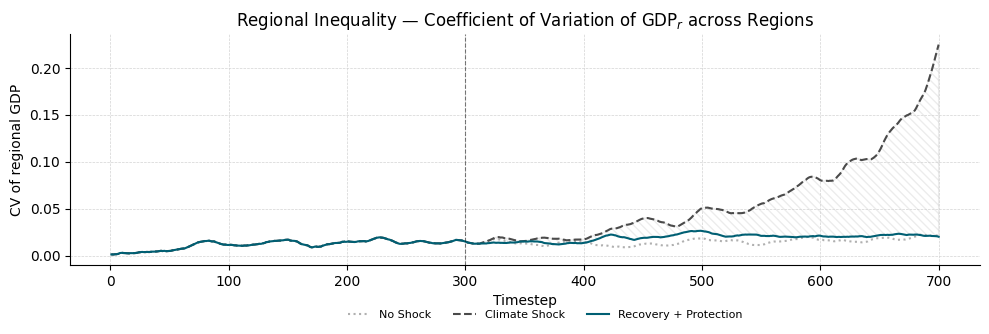

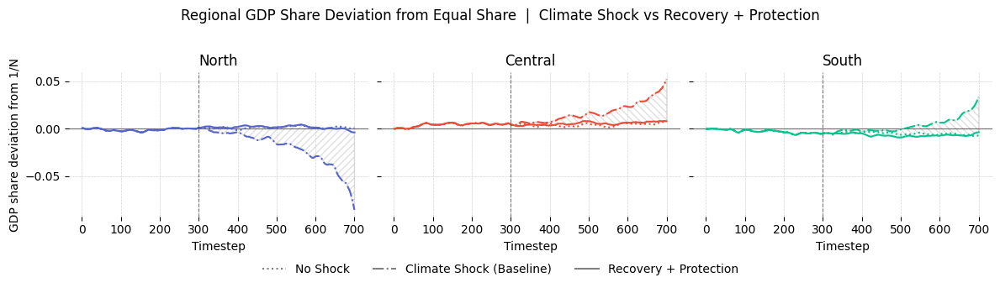

In [211]:
# ── Scenario 5: Recovery + Protection ─────────────────────────────────────────
plot_cv_figure(["scenario_1", "scenario_2", "scenario_5"], "scenario_2", "scenario_5")
plot_share_deviation_figure("scenario_2", "scenario_5", "scenario_1")


### Scenario 4

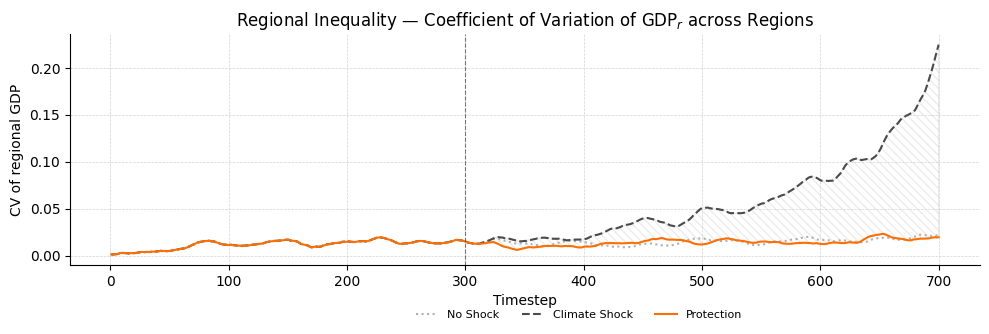

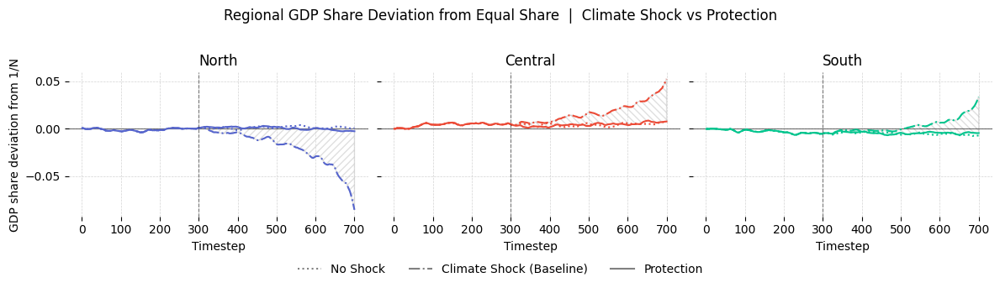

In [212]:
# ── Scenario 4: Protection ──────────────────────────────────────────────────────
plot_cv_figure(["scenario_1", "scenario_2", "scenario_4"], "scenario_2", "scenario_4")
plot_share_deviation_figure("scenario_2", "scenario_4", "scenario_1")


### Scenario 3

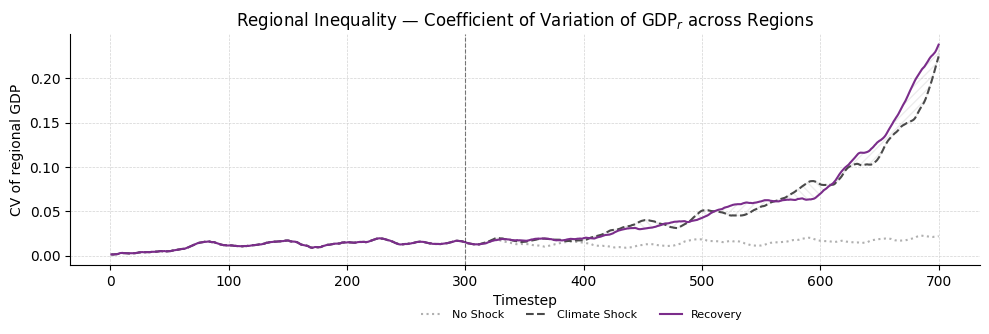

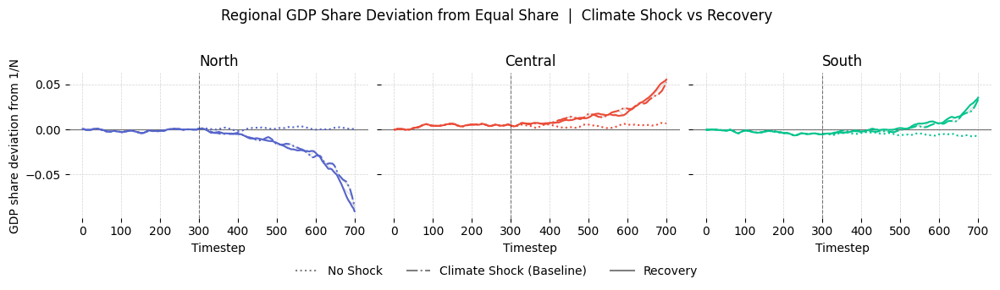

In [213]:
# ── Scenario 3: Recovery ────────────────────────────────────────────────────────
plot_cv_figure(["scenario_1", "scenario_2", "scenario_3"], "scenario_2", "scenario_3")
plot_share_deviation_figure("scenario_2", "scenario_3", "scenario_1")


### Scenraio 2

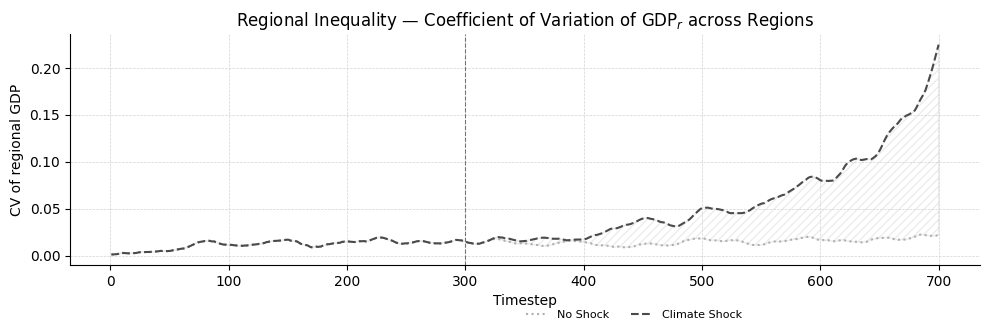

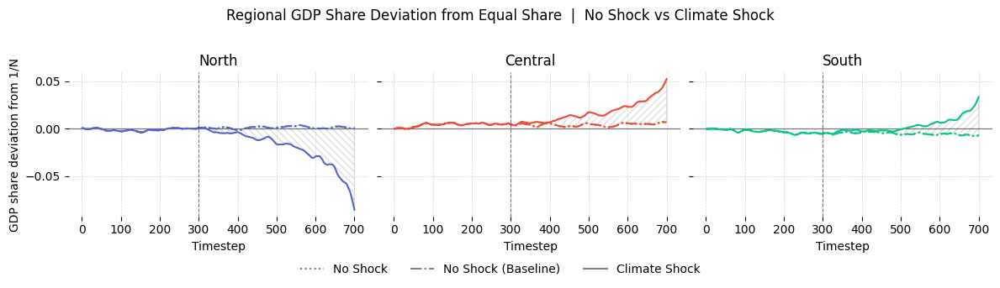

In [214]:
# ── Scenario 2: Climate Shock (baseline) ────────────────────────────────────────
plot_cv_figure(["scenario_1", "scenario_2"], "scenario_1", "scenario_2")
plot_share_deviation_figure("scenario_1", "scenario_2", "scenario_1")


## Market share dynamics

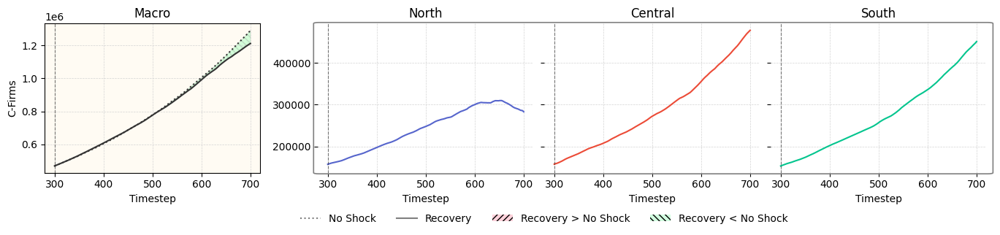

In [215]:
compare_regional_metric(
    metric="Q2tot",
    metric_label="C-Firms",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_3",
    baseline_scenario_num="scenario_1",
    # no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

## Market exiting dynamics

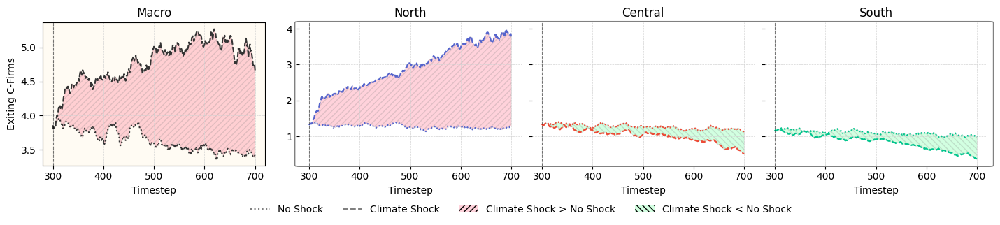

In [216]:
compare_regional_metric(
    metric="Exiting_C-Firms",
    metric_label="Exiting C-Firms",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_2",
    baseline_scenario_num="scenario_1",
    # no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

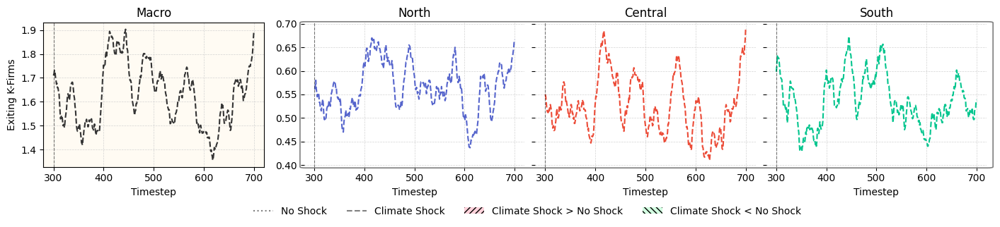

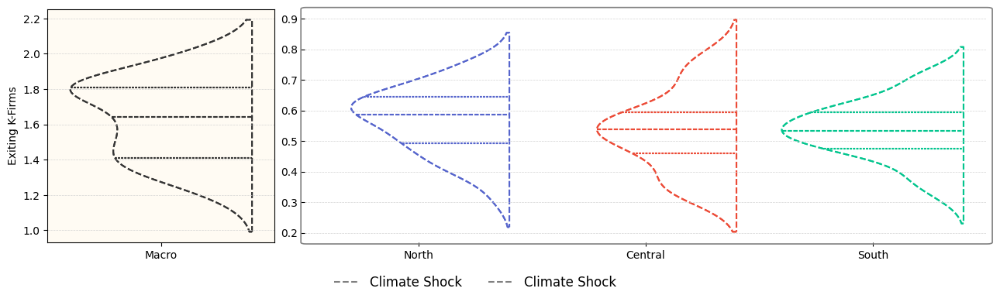

In [217]:
compare_regional_metric(
    metric="exiting_1",
    metric_label="Exiting K-Firms",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_2",
    baseline_scenario_num="scenario_1",
    # no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=green,
    color_above=red,
)

plot_regional_metric_distribution(
        metric="exiting_1",
        metric_label="Exiting K-Firms",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num='scenario_2',
        output=OUTPUT,
        # share_y_macro=True,
        # ylim=(5, 20)
    )

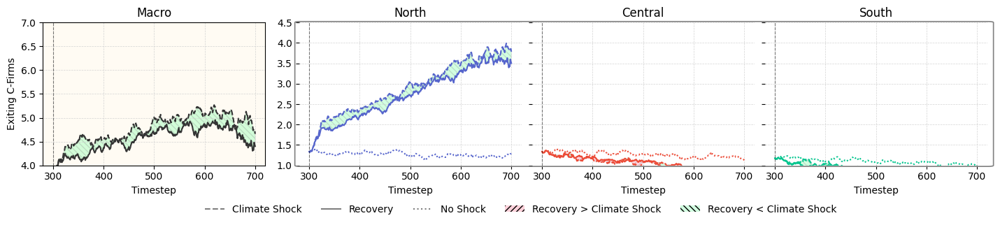

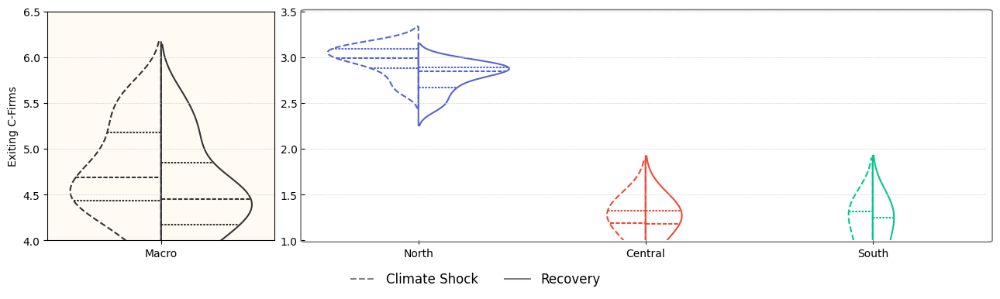

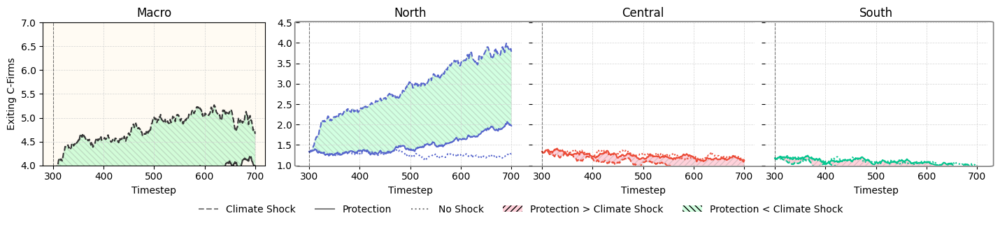

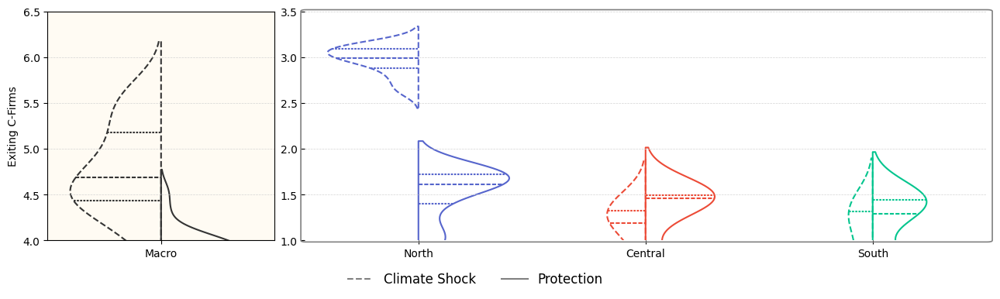

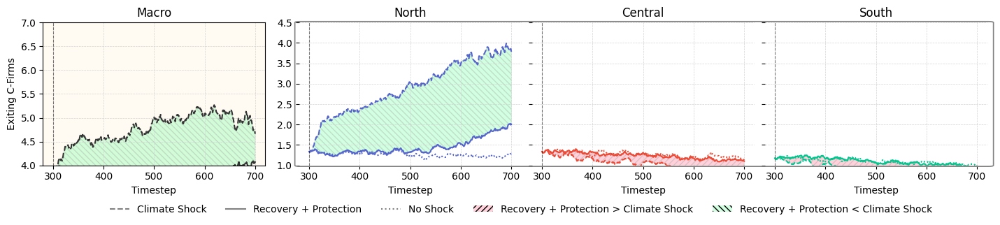

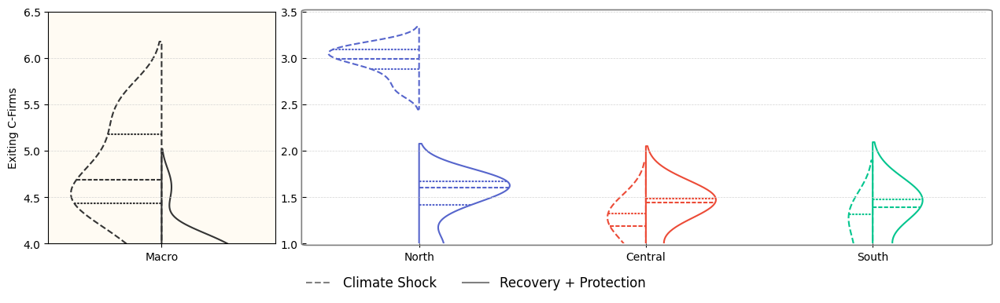

In [218]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:

    compare_regional_metric(
        metric="Exiting_C-Firms",
        metric_label="Exiting C-Firms",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_num=scenario_num,
        baseline_scenario_num="scenario_2",
        no_shock_scenario_num="scenario_1",
        share_y_macro=False,
        output=OUTPUT,
        tmin=300,
        window=20,
        # color above baseline should be red-orange and below should be mint green
        color_below=green,
        color_above=red,
        ylim_macro=(4, 7),
        ylim_regional=(1, 4.5),
    )

    plot_regional_metric_distribution(
        metric="Exiting_C-Firms",
        metric_label="Exiting C-Firms",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        ylim_macro=(4, 6.5),
        ylim_regional=(1, 3.5),
    )

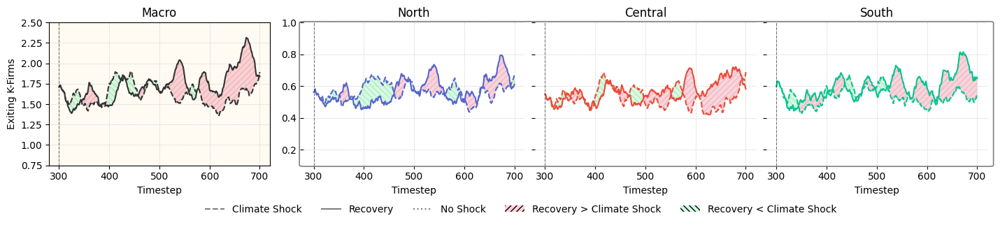

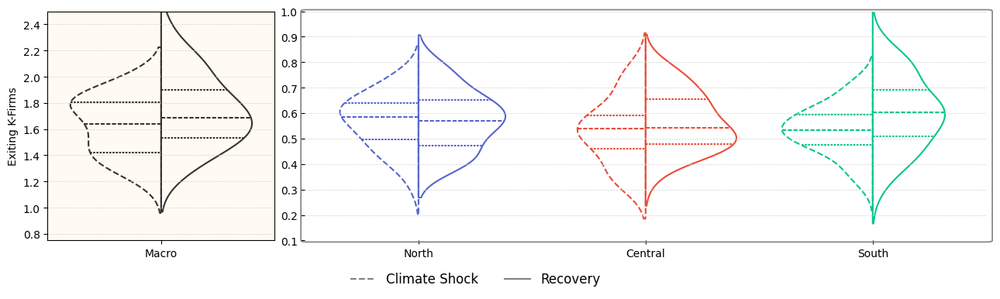

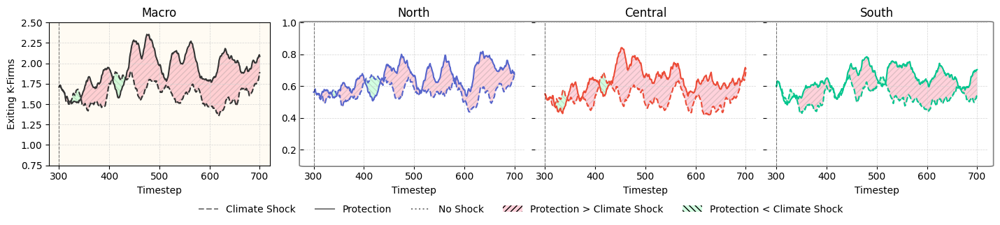

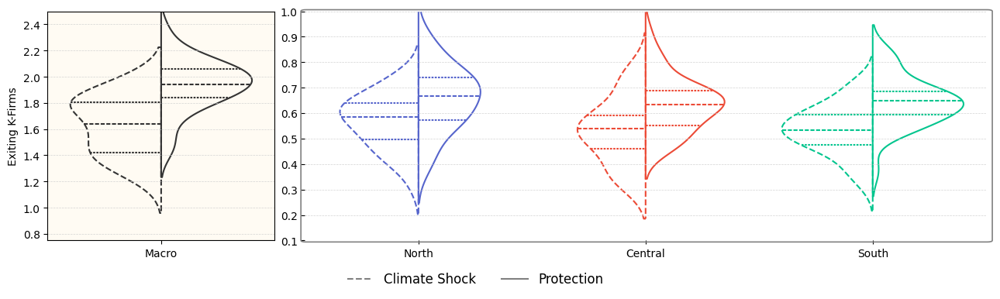

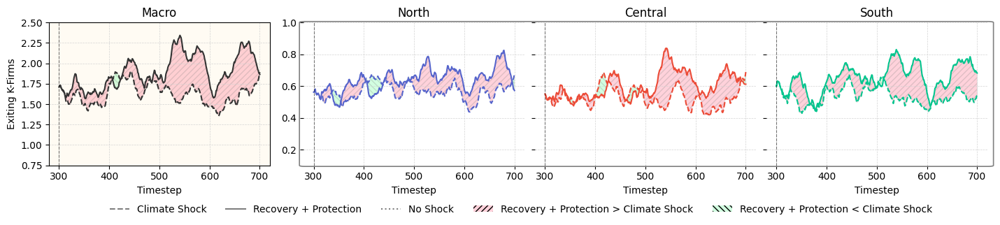

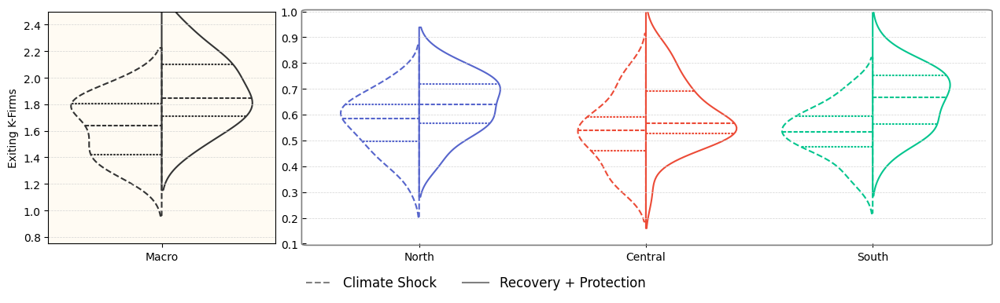

In [219]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:

    compare_regional_metric(
        metric="exiting_1",
        metric_label="Exiting K-Firms",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_num=scenario_num,
        baseline_scenario_num="scenario_2",
        no_shock_scenario_num="scenario_1",
        share_y_macro=False,
        output=OUTPUT,
        tmin=300,
        window=20,
        # color above baseline should be red-orange and below should be mint green
        color_below=green,
        color_above=red,
        ylim_macro=(0.75, 2.5),
        ylim_regional=(0.1, 1),
    )

    plot_regional_metric_distribution(
        metric="exiting_1",
        metric_label="Exiting K-Firms",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        ylim_macro=(0.75, 2.5),
        ylim_regional=(0.1, 1),
    )

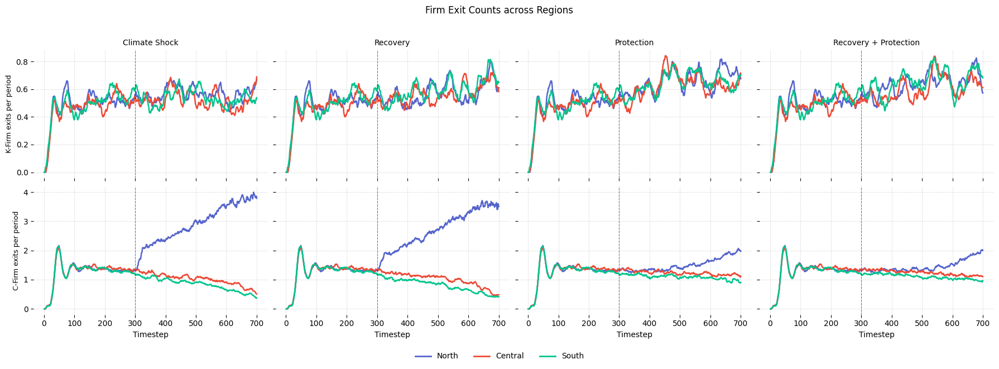

In [220]:

# Exit counts: available across all 5 scenarios
_all_scenarios = ['scenario_2', 'scenario_3', 'scenario_4', 'scenario_5']
_tmin = 0
_window = 20
fig2, axes2 = plt.subplots(2, len(_all_scenarios), figsize=(18, 6),
                            sharex=True, sharey='row')

_exit_specs = [
    ('exiting_1',       'K-Firm exits per period'),
    ('Exiting_C-Firms', 'C-Firm exits per period'),
]

for row, (metric, row_label) in enumerate(_exit_specs):
    for col, snum in enumerate(_all_scenarios):
        ax = axes2[row, col]
        df = scenario_results[snum]
        reg_df = df[df['region'].isin([1, 2, 3])].copy()

        if metric not in reg_df.columns or reg_df[metric].isna().all():
            ax.text(0.5, 0.5, 'N/A', transform=ax.transAxes,
                    ha='center', va='center', color='gray')
            ax.set_title(SCENARIO_META[snum]['name'] if row == 0 else '',
                         fontsize=10)
            ax.axis('off')
            continue

        avg = (
            reg_df.groupby(['t', 'region'])[metric]
            .mean()
            .reset_index()
            .sort_values(['region', 't'])
        )
        avg[metric] = avg.groupby('region')[metric].transform(
            lambda x: x.rolling(window=_window, min_periods=1).mean()
        )
        avg = avg[avg['t'] >= _tmin]

        for region_id in [1, 2, 3]:
            color = region_meta[region_id]['color']
            sub = avg[avg['region'] == region_id]
            ax.plot(sub['t'], sub[metric], color=color, linewidth=1.8)

        ax.axvline(x=300, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
        ax.grid(True, color='lightgray', linestyle='--', linewidth=0.5)
        ax.spines[['top', 'right', 'left', 'bottom']].set_visible(False)

        if row == 0:
            ax.set_title(SCENARIO_META[snum]['name'], fontsize=10)
        if row == 1:
            ax.set_xlabel("Timestep")
        if col == 0:
            ax.set_ylabel(row_label, fontsize=9)

legend_handles = [
    Line2D([0], [0], color=region_meta[r]['color'], linewidth=2,
           label=region_meta[r]['name'])
    for r in [1, 2, 3]
]
fig2.legend(handles=legend_handles, loc='lower center', ncol=3,
            frameon=False, bbox_to_anchor=(0.5, -0.06), fontsize=10)

plt.suptitle("Firm Exit Counts across Regions", y=1.02)
plt.tight_layout()

if OUTPUT is not None:
    plt.savefig(OUTPUT / "market_concentration_exits.png",
                dpi=300, bbox_inches='tight')
plt.show()


## Regional Population

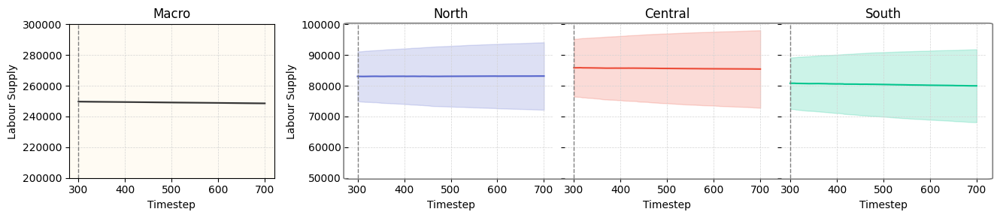

In [221]:

plot_regional_metric(
    metric="LS",
    metric_label="Labour Supply",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_1",
    output=OUTPUT,
    share_y_macro=False,
    window=None,
    tmin=300,tmax=700,
    ylim_macro=(200000, 300000),
    ylim_regional=(50000, 100000)
)


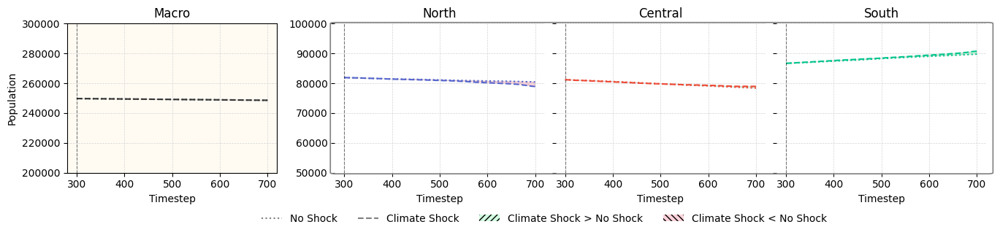

In [163]:
compare_regional_metric(
    metric="LS",
    metric_label="Population",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num='scenario_2',
    baseline_scenario_num="scenario_1",
    # no_shock_scenario_num="scenario_1",
    share_y_macro=False,
    output=OUTPUT,
    tmin=300,
    window=4,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
    ylim_macro=(200000, 300000),
    ylim_regional=(50000, 100000)
)


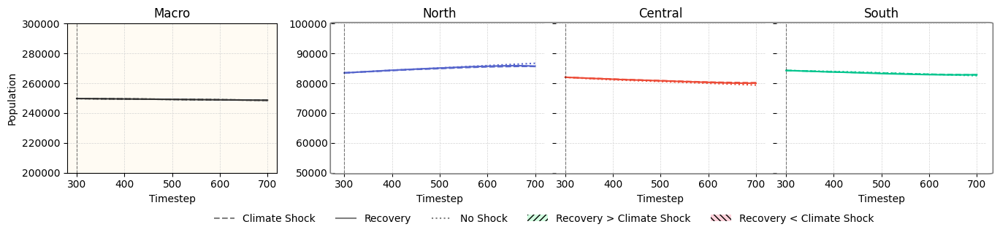

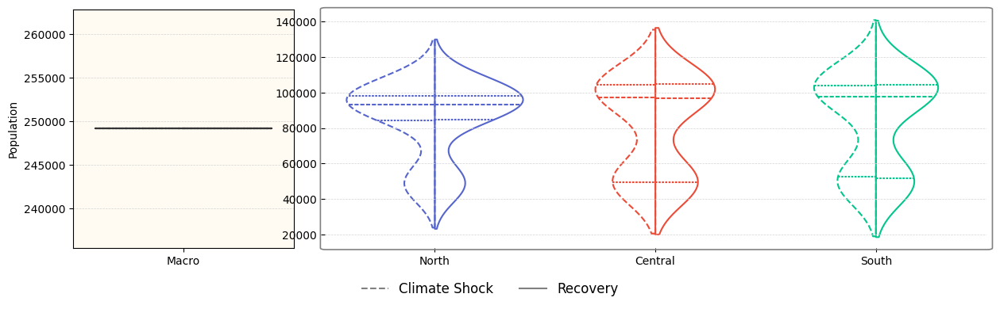

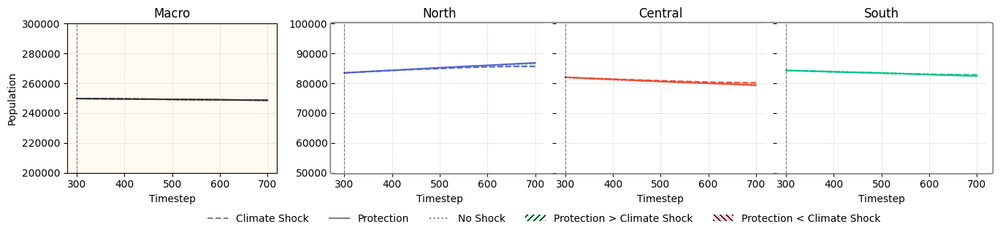

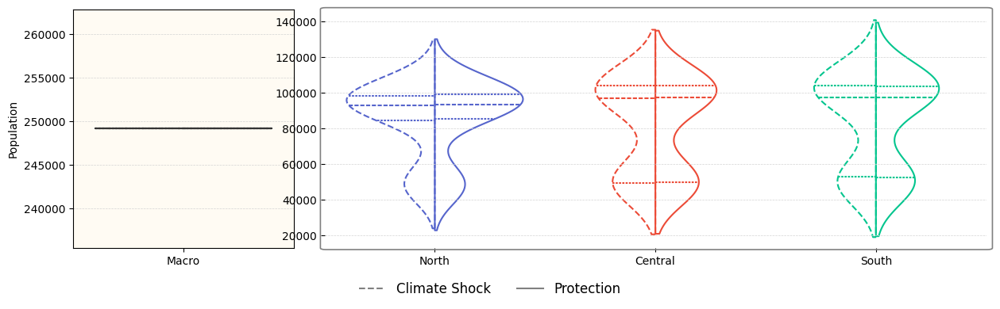

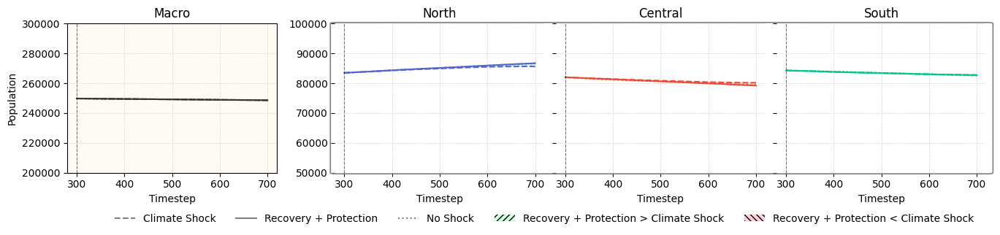

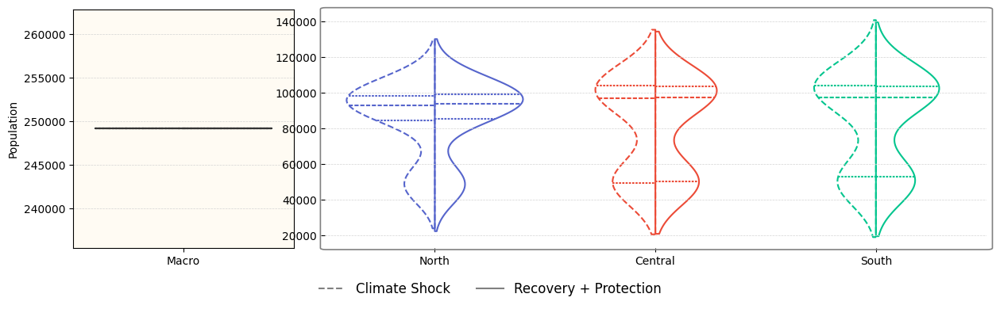

In [103]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:

    compare_regional_metric(
        metric="LS",
        metric_label="Population",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_num=scenario_num,
        baseline_scenario_num="scenario_2",
        no_shock_scenario_num="scenario_1",
        share_y_macro=False,
        output=OUTPUT,
        tmin=300,
        window=20,
        # color above baseline should be red-orange and below should be mint green
        color_below=red,
        color_above=green,
        ylim_macro=(200000, 300000),
        ylim_regional=(50000, 100000)
    )

    plot_regional_metric_distribution(
        metric="LS",
        metric_label="Population",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        share_y_macro=False,
        # ylim=(5, 20)
    )

## Regional Recovery Investment

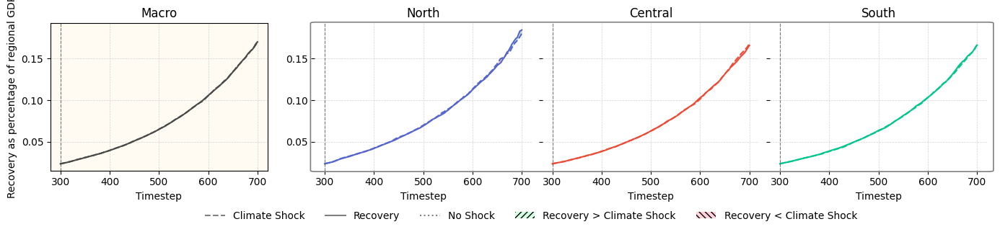

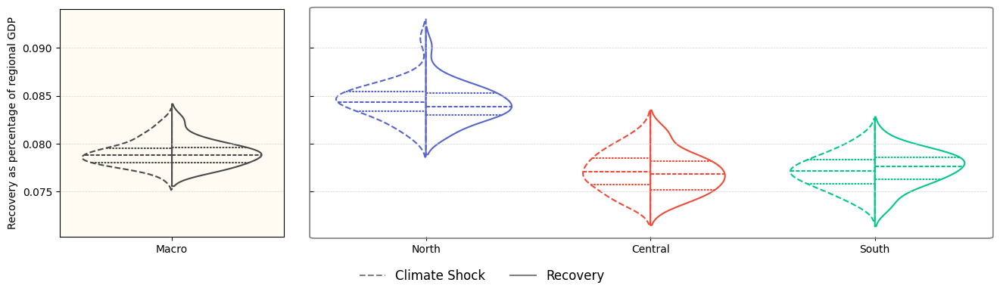

In [37]:
compare_regional_metric(
    metric="Recovery_over_GDP",
    metric_label="Recovery as percentage of regional GDP",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_3",
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
)

plot_regional_metric_distribution(
    metric="Recovery_over_GDP",
    metric_label="Recovery as percentage of regional GDP",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_3",
    output=OUTPUT,
    share_y_macro=True,
    # ylim=(5, 20)
)

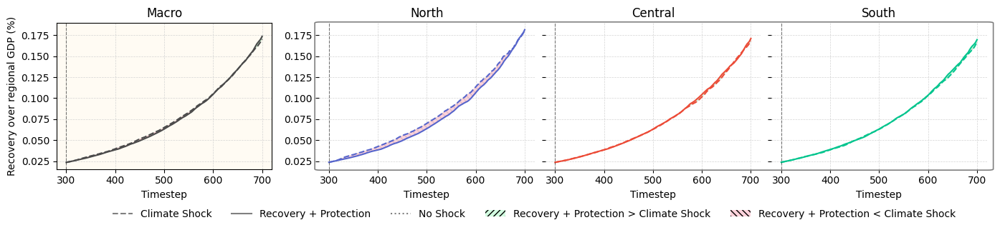

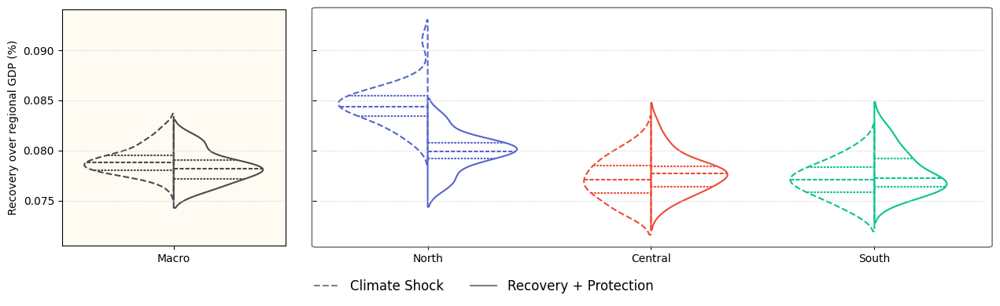

In [38]:
compare_regional_metric(
    metric="Recovery_over_GDP",
    metric_label="Recovery over regional GDP (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_5",
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
)

plot_regional_metric_distribution(
    metric="Recovery_over_GDP",
    metric_label="Recovery over regional GDP (%)",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_5",
    output=OUTPUT,
    share_y_macro=True,
)

## Protection Investment

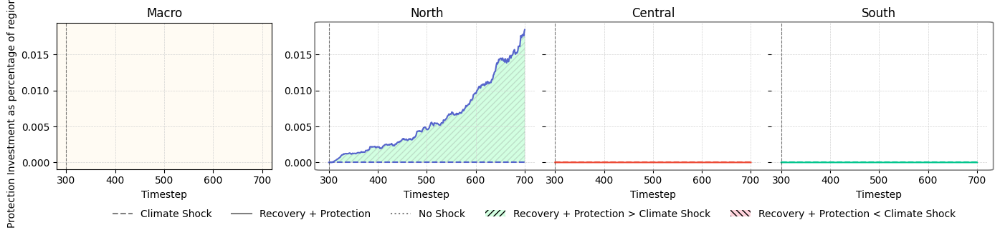

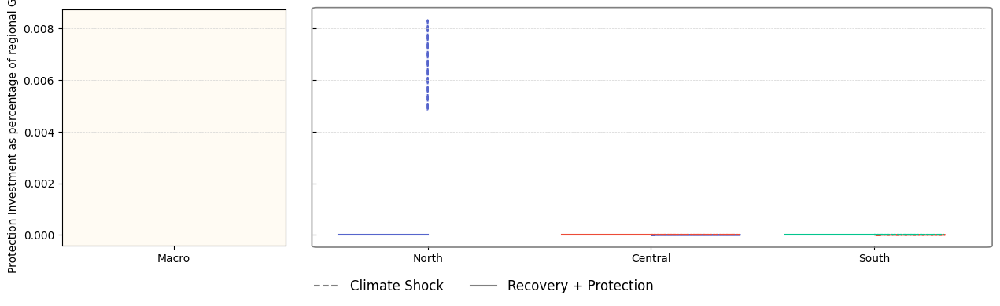

In [39]:
compare_regional_metric(
    metric="I_protection_over_GDP",
    metric_label="Protection Investment as percentage of regional GDP",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_num="scenario_5",
    baseline_scenario_num="scenario_2",
    no_shock_scenario_num="scenario_1",
    share_y_macro=True,
    output=OUTPUT,
    tmin=300,
    window=20,
    # color above baseline should be red-orange and below should be mint green
    color_below=red,
    color_above=green,
)

plot_regional_metric_distribution(
    metric="I_protection_over_GDP",
    metric_label="Protection Investment as percentage of regional GDP",
    scenario_results=scenario_results,
    region_meta=region_meta,
    scenario_meta=SCENARIO_META,
    baseline_scenario_num="scenario_2",
    scenario_num="scenario_5",
    output=OUTPUT,
    share_y_macro=True,
    # ylim=(5, 20)
)

## Regional Grant recieved from central government

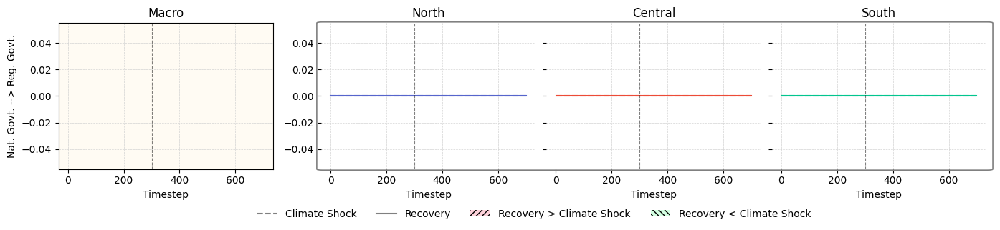

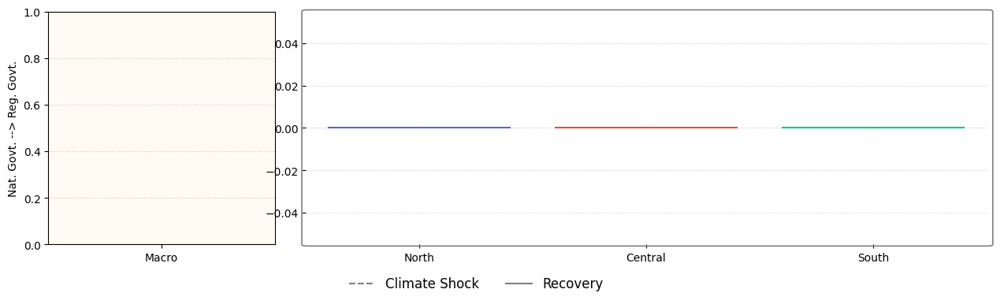

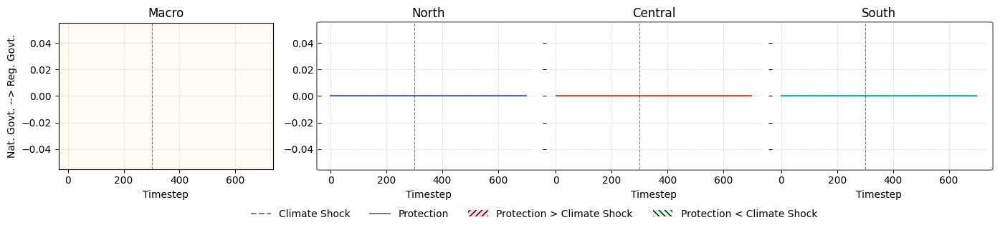

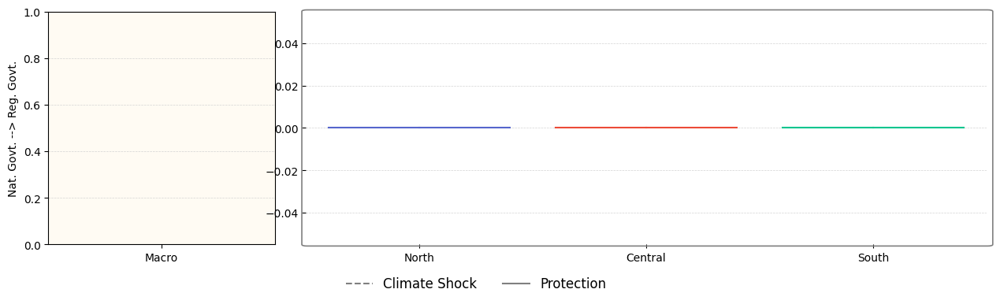

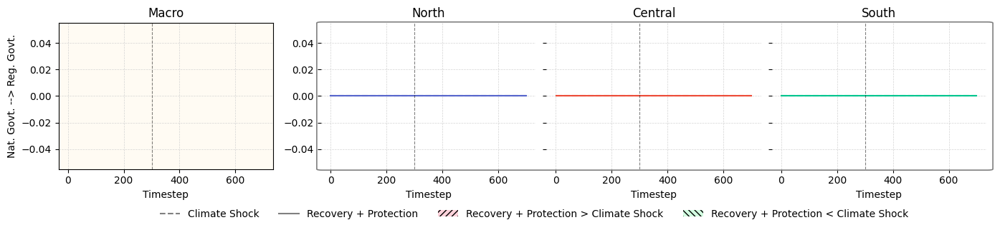

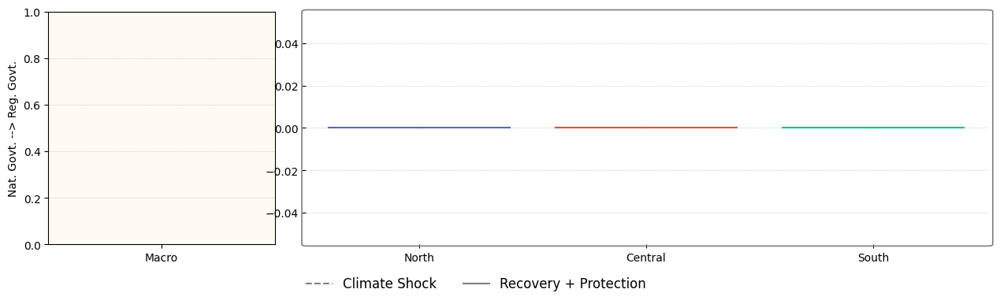

In [63]:
for scenario_num in ['scenario_3', 'scenario_4', 'scenario_5']:
    compare_regional_metric(
        metric="RegGov_TopupGrant",
        metric_label="Nat. Govt. --> Reg. Govt.",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_num=scenario_num,
        baseline_scenario_num="scenario_2",
        # no_shock_scenario_num="scenario_1",
        # share_y_macro=True,
        output=OUTPUT,
        tmin=0,
        window=20,
        # color above baseline should be red-orange and below should be mint green
        color_below=green,
        color_above=red,
    )

    plot_regional_metric_distribution(
        metric="RegGov_TopupGrant",
        metric_label="Nat. Govt. --> Reg. Govt.",
        scenario_results=scenario_results,
        region_meta=region_meta,
        scenario_meta=SCENARIO_META,
        baseline_scenario_num="scenario_2",
        scenario_num=scenario_num,
        output=OUTPUT,
        # share_y_macro=True,
        # ylim=(5, 20)
    )

## Regional Share of National Transfers

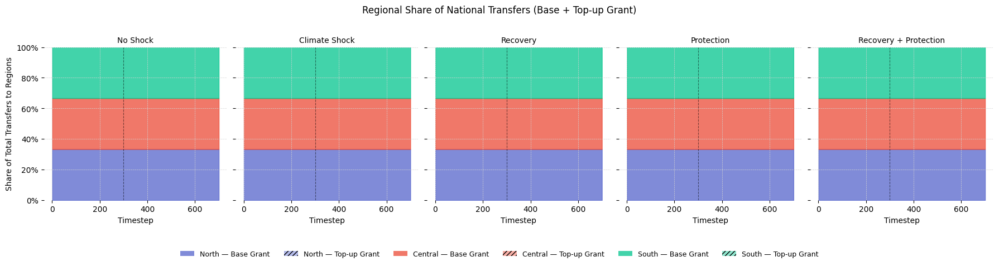

In [64]:

from matplotlib.patches import Patch
import matplotlib.ticker as mticker

scenarios_to_plot = ['scenario_1', 'scenario_2', 'scenario_3', 'scenario_4', 'scenario_5']
n_scenarios = len(scenarios_to_plot)
_tmin = 0
_window = 20

fig, axes = plt.subplots(1, n_scenarios, figsize=(18, 4), sharey=True)

for ax, snum in zip(axes, scenarios_to_plot):
    df = scenario_results[snum]

    # Regional rows only
    reg_df = df[df['region'].isin([1, 2, 3])].copy()
    reg_df['base_transfer']  = reg_df['RegGov_BaseGrant'].fillna(0)
    reg_df['topup_transfer'] = reg_df['RegGov_TopupGrant'].fillna(0)
    reg_df['total_transfer'] = reg_df['base_transfer'] + reg_df['topup_transfer']

    # Grand total across all regions per (t, run)
    grand = (
        reg_df.groupby(['t', 'run'])['total_transfer']
        .sum()
        .reset_index(name='grand_total')
    )
    reg_df = reg_df.merge(grand, on=['t', 'run'])

    # Shares (guard against zero-transfer periods)
    reg_df['base_share']  = reg_df['base_transfer']  / reg_df['grand_total'].replace(0, float('nan'))
    reg_df['topup_share'] = reg_df['topup_transfer'] / reg_df['grand_total'].replace(0, float('nan'))

    # Average over runs then rolling smooth
    avg = (
        reg_df.groupby(['t', 'region'])[['base_share', 'topup_share']]
        .mean()
        .reset_index()
        .sort_values(['region', 't'])
    )
    for col in ['base_share', 'topup_share']:
        avg[col] = avg.groupby('region')[col].transform(
            lambda x: x.rolling(window=_window, min_periods=1).mean()
        )
    avg = avg[avg['t'] >= _tmin]

    t_vals = avg[avg['region'] == 1]['t'].values
    bottom = np.zeros(len(t_vals))

    for region_id in [1, 2, 3]:
        color = region_meta[region_id]['color']
        sub = avg[avg['region'] == region_id]
        base  = sub['base_share'].values
        topup = sub['topup_share'].values

        # Base grant slice
        ax.fill_between(t_vals, bottom, bottom + base,
                        color=color, alpha=0.75)
        # Top-up grant slice (hatched) stacked on top
        ax.fill_between(t_vals, bottom + base, bottom + base + topup,
                        color=color, alpha=0.45, hatch='////', linewidth=0.0)

        bottom = bottom + base + topup

    ax.set_title(SCENARIO_META[snum]['name'], fontsize=10)
    ax.set_xlabel("Timestep")
    ax.axvline(x=300, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1, decimals=0))
    ax.set_ylim(0, 1)
    ax.grid(True, color='lightgray', linestyle='--', linewidth=0.5)
    ax.spines[['top', 'right', 'left', 'bottom']].set_visible(False)

axes[0].set_ylabel("Share of Total Transfers to Regions")

# Legend
legend_handles = []
for region_id in [1, 2, 3]:
    color = region_meta[region_id]['color']
    name  = region_meta[region_id]['name']
    legend_handles.append(Patch(facecolor=color, alpha=0.75,
                                label=f"{name} — Base Grant"))
    legend_handles.append(Patch(facecolor=color, alpha=0.45, hatch='////',
                                label=f"{name} — Top-up Grant"))

fig.legend(handles=legend_handles, loc='lower center', ncol=6,
           frameon=False, bbox_to_anchor=(0.5, -0.14), fontsize=9)

plt.suptitle("Regional Share of National Transfers (Base + Top-up Grant)", y=1.02)
plt.tight_layout()

if OUTPUT is not None:
    plt.savefig(OUTPUT / "regional_transfer_shares.png", dpi=300, bbox_inches='tight')

plt.show()


## Regional Public Stock (Economic Affairs)

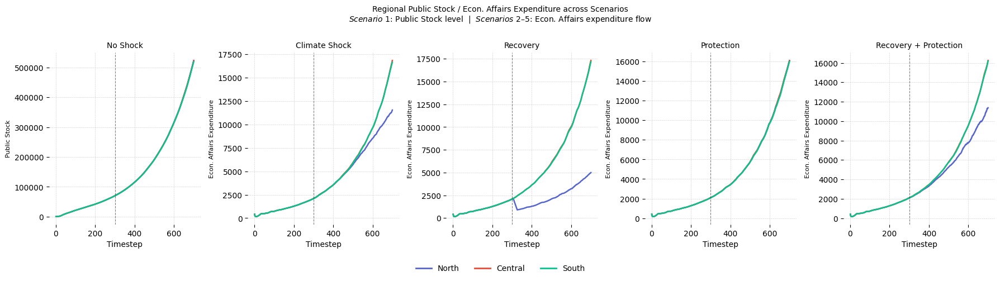

In [65]:


# PublicStock is only in ymc_reg output (scenario 1 no-shock).
# For scenarios 2-5 (resultsexp_reg files) use RegGov_EA — the Economic Affairs
# expenditure flow that accumulates into PublicStock.
_METRIC_MAP = {
    'scenario_1': ('PublicStock',  'Public Stock'),
    'scenario_2': ('RegGov_EA',    'Econ. Affairs Expenditure'),
    'scenario_3': ('RegGov_EA',    'Econ. Affairs Expenditure'),
    'scenario_4': ('RegGov_EA',    'Econ. Affairs Expenditure'),
    'scenario_5': ('RegGov_EA',    'Econ. Affairs Expenditure'),
}
_tmin   = 0
_window = 20
_scenarios = ['scenario_1', 'scenario_2', 'scenario_3', 'scenario_4', 'scenario_5']

fig, axes = plt.subplots(1, len(_scenarios), figsize=(18, 4), sharey=False)

for ax, snum in zip(axes, _scenarios):
    metric, ylabel = _METRIC_MAP[snum]
    df = scenario_results[snum]
    reg_df = df[df['region'].isin([1, 2, 3])].copy()

    avg = (
        reg_df.groupby(['t', 'region'])[metric]
        .mean()
        .reset_index()
        .sort_values(['region', 't'])
    )
    avg[metric] = avg.groupby('region')[metric].transform(
        lambda x: x.rolling(window=_window, min_periods=1).mean()
    )
    avg = avg[avg['t'] >= _tmin]

    for region_id in [1, 2, 3]:
        color = region_meta[region_id]['color']
        sub = avg[avg['region'] == region_id]
        ax.plot(sub['t'], sub[metric], color=color, linewidth=1.8,
                label=region_meta[region_id]['name'])

    ax.set_title(SCENARIO_META[snum]['name'], fontsize=10)
    ax.set_xlabel("Timestep")
    ax.axvline(x=300, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
    ax.grid(True, color='lightgray', linestyle='--', linewidth=0.5)
    ax.spines[['top', 'right', 'left', 'bottom']].set_visible(False)
    ax.set_ylabel(ylabel, fontsize=8)

legend_handles = [
    Line2D([0], [0], color=region_meta[r]['color'], linewidth=2,
           label=region_meta[r]['name'])
    for r in [1, 2, 3]
]
fig.legend(handles=legend_handles, loc='lower center', ncol=3,
           frameon=False, bbox_to_anchor=(0.5, -0.10), fontsize=10)

fig.text(0.5, 1.04,
         "Regional Public Stock / Econ. Affairs Expenditure across Scenarios\n"
         r"$\it{Scenario\ 1}$: Public Stock level  |  $\it{Scenarios\ 2–5}$: Econ. Affairs expenditure flow",
         ha='center', va='bottom', fontsize=10)

plt.tight_layout()

if OUTPUT is not None:
    plt.savefig(OUTPUT / "regional_public_stock.png", dpi=300, bbox_inches='tight')

plt.show()
